# Demo notebook for computer vision basics 
## Hands-on Tutorial KDD2020
* **By** Dr. James G. Shanahan
* **Email:** James.Shanahan __AT__ gmail.com


## NOTES for running on a Docker Container (please ignore)

Installation
Step 1. Install [Docker](https://docs.docker.com/engine/installation/) on your local machine.

Step 2. Grab the all-in-one deep learning image from Docker Hub/Repo by executing the following command on your Shell/CMD window:
    
```bash
docker pull ufoym/deepo:cpu
```
    
    
**Usage**
Now you can try this command:

```bash
docker run -it ufoym/deepo:cpu bash
```
If you want to share your data and configurations between the host (your machine or VM) and the container in which you are using Deepo, use the -v option, e.g.

```bash
docker run -it -v /host/data:/data -v /host/config:/config ufoym/deepo:cpu bash
```
This will make `/host/data` from the host visible as `/data` in the container, and `/host/config` as `/config`. Such isolation reduces the chances of your containerized experiments overwriting or using wrong data. Having said that I typically use the following on my Mac.

```bash
docker run -it -p 8888:8888 -v /Users/jshanahan/:/home ufoym/deepo:cpu bash
docker run -it -p 8889:8889 -v /Users/jshanahan/:/home ufoym/deepo:cpu bash

docker run -it -v /host/data:/data -v /host/config:/config ufoym/deepo:cpu bash
```


Please note that some frameworks (e.g. PyTorch) use shared memory to share data between processes, so if multiprocessing is used the default shared memory segment size that container runs with is not enough, and you should increase shared memory size either with --ipc=host or --shm-size command line options to docker run.


You are now ready to begin your journey.
```bash
$ python
```
```python
>>> import tensorflow
>>> import sonnet
>>> import torch
>>> import keras
>>> import mxnet
>>> import cntk
>>> import chainer
>>> import theano
>>> import lasagne
>>> import caffe
>>> import caffe2
>>> import paddle
```

## Download and set up some stuff that will be used in this notebook
### install wget and unzip linux utilities

Install various linux utilities that will be used through out this notebook.

In [ ]:
# to install wget, and unzip uncomment the following lines
#
#!apt-get -y update
#!apt-get -y install build-essential wget cmake unzip

### Download an image to work with

In [15]:
!wget "https://www.dropbox.com/s/0t3ffugr6s0z9gw/SF_golden_gate_bridge.JPG?dl=0" -O SF_golden_gate_bridge_3648x2736.jpg

wget: /usr/local/lib/libuuid.so.1: no version information available (required by wget)
--2020-07-23 18:59:16--  https://www.dropbox.com/s/0t3ffugr6s0z9gw/SF_golden_gate_bridge.JPG?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.7.1, 2620:100:601a:1::a27d:701
Connecting to www.dropbox.com (www.dropbox.com)|162.125.7.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/0t3ffugr6s0z9gw/SF_golden_gate_bridge.JPG [following]
--2020-07-23 18:59:16--  https://www.dropbox.com/s/raw/0t3ffugr6s0z9gw/SF_golden_gate_bridge.JPG
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucef940623ffaf44633edb51cd8d.dl.dropboxusercontent.com/cd/0/inline/A8FHeu8yjciP0lafNrq_qqZ4-Sw4tRTbLDtc0MCSYdGnD0WfuCYFp-xoCEMytIOA5LetKttpl0Mqp4-DNnhxlsepdDX2x1at0ZzjOOUyz86DynqEyCh4UiDKLGUUuY7GTJY/file# [following]
--2020-07-23 18:59:17--  https://ucef940623ffaf44633edb51cd8d.dl.dropboxusercontent

# Goals of this notebook

* Learn about Image, pixel basics and how to manipulate them programmtically
  * Learn how images represente and how they are represented
  * How to load and handle image data using various standard Python library
  * How to manually standardize and normalize pixel values to prepare images for various downstream image tasks (primarily image classification, and object detection)
* Learn how Keras works with images
  * How to load and handle image data directly using the Keras deep learning library
  * How to scale pixel values to prepare images for modeling using Keras 
  * How to load large image datasets from directories using Keras 
  * How to use data augmentation to expand the size of an image training dataset
* How to build an image classifier from scratch

# Intro to Computer Vision

## Images, Pixels, color maps

Pixels are the atomic building blocks of an image. Every image consists of a set of pixels laid out in a gridlike manner. Normally, a pixel is considered the “color” or the “intensity” of light that appears in a given
place in our image (field of view). 
In a grayscale image, each pixel is a scalar value between 0 and 255, where 0 (zero) corresponds
to “black” and 255 to “white”. Values between 0 and 255 are varying shades of gray, where
values closer to 0 are darker and values closer to 255 are lighter.  Color pixels  are normally represented using the [Red-Green-Blue (RGB)](https://en.wikipedia.org/wiki/RGB_color_model) additive color model. Other color models also exist including the [Hue-Saturation-Value (HSV) color model](https://en.wikipedia.org/wiki/HSL_and_HSV), but are  not relevant here. Most modern color models have 3 dimensions (like RGB), and can therefore be depicted as 3D shapes, while other models have more dimensions (like CMYK).

Pixels in the RGB color space are no longer a scalar value like in a grayscale/single channel
image – instead, the pixels are represented by a vector/list of three values: 
* one value for the Red component, one for Green, and another for Blue. 
Each of the Red, Green, and Blue channels can have values defined in the range [0, 255] for a total of 256 “shades” of their respective colors. Given
that the pixel value only needs to be in the range [0;255], we normally use 8-bit unsigned integers
to represent the intensity. Given the three Red, Green, and Blue values, these can be combined into an RGB tuple in the
form (red, green, blue). This tuple represents a given color in the RGB color space. The
RGB color space is an example of an additive color space: the more of each color is added, the
brighter the pixel becomes and closer to white.  RGB color space a bit unintuitive for humans to easily define shades of color without using a `color picker` tool. It doesn’t mimic how humans perceive color. Despite these drawbacks, nearly most images we  work with will be represented in RGB color space.

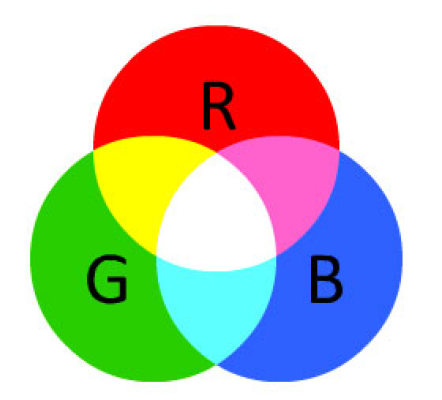

##  Image Coordinate Systems

There are two common coordinate systems used in the field of image processing and analysis: 
* the matrix coordinate system 
* and the graphics/Cartesian coordinate system  

These coordinate systems differ primarily in the location of the origin, and in terms of how the pixel data is stored. in how the locations of pixels are expressed. The following figure captures the key differences in these two coordinae systems:

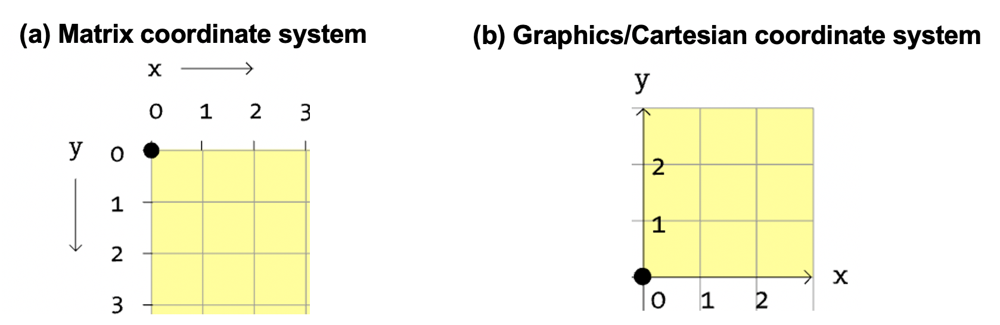

A gray-scale image is represented as a grid of pixels. The
origin point (0;0) corresponds to the upper-left corner of the image (based on a matrix representation). As we move down and to the
right, both the x and y values increase.  In python, a grayscale image can defined as a 2D NumPy multidimensional arrays with a height, width. 

A color image, expressed in terms of RGB can be represented in matrix form as a  3D NumPy multidimensional arrays with page, height and width, where there are three pages corresponding  to the red, green, blue intensity matrices. Image RGB data can reshaped in Python to yielding many different formats:

* 

An RGB image is represented by three values, one for each of the Red, Green,
and Blue components, and as such it can be represented programmatically as three
independent matrices of width W and height H. See below for examples.



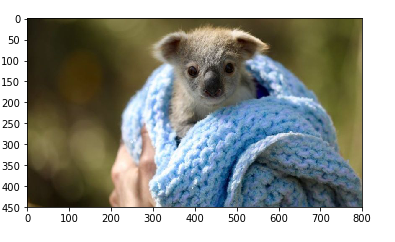

  * python's numpy-based image format uses the matrix coordinate system to store and access images (Row, Columm, RGB)
  * Python's Image Processing library (PIL) also uses the matrix  coordinate system  to store and access images but uses a different index ordering. Images in PIL format are stored in the following way (Columm, Row, RGB)



Images are stored as a arrays. This can be done naturally  in numpy as a 3D array with with the following dimensions [height, width, channels], aka, [Row, Col, RGB].

In Python, Pillow is the most popular and standard library when it comes to working with image data.

NumPy uses the asarray() class to convert PIL images into NumPy arrays. The np.array function also produce the same result. The type function displays the class of an image.

The process can be reversed using the Image.fromarray() function. This function comes in handy when the manipulation is performed on numpy.ndarray image data, that we laterwant to save as a PNG or JPEG file.

## Deep Learning frameworks are either `channels first` or `channels last`

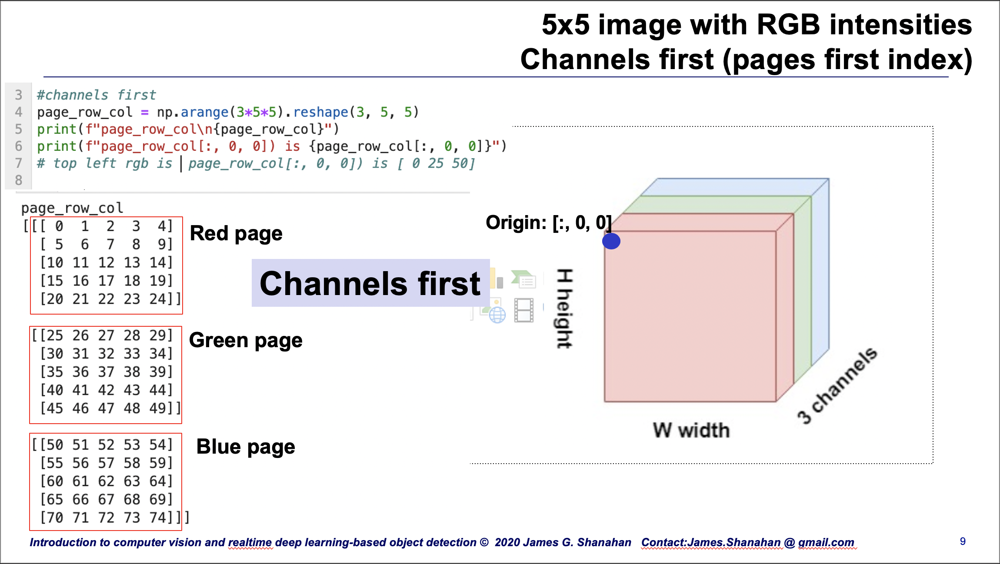

In [108]:
import numpy as np

#channels first
page_row_col = np.arange(3*5*5).reshape(3, 5, 5)
print(f"page_row_col\n{page_row_col}")
print(f"page_row_col[:, 0, 0]) is {page_row_col[:, 0, 0]}")
# top left rgb is  page_row_col[:, 0, 0]) is [ 0 25 50]

page_row_col
[[[ 0  1  2  3  4]
  [ 5  6  7  8  9]
  [10 11 12 13 14]
  [15 16 17 18 19]
  [20 21 22 23 24]]

 [[25 26 27 28 29]
  [30 31 32 33 34]
  [35 36 37 38 39]
  [40 41 42 43 44]
  [45 46 47 48 49]]

 [[50 51 52 53 54]
  [55 56 57 58 59]
  [60 61 62 63 64]
  [65 66 67 68 69]
  [70 71 72 73 74]]]
page_row_col[:, 0, 0]) is [ 0 25 50]


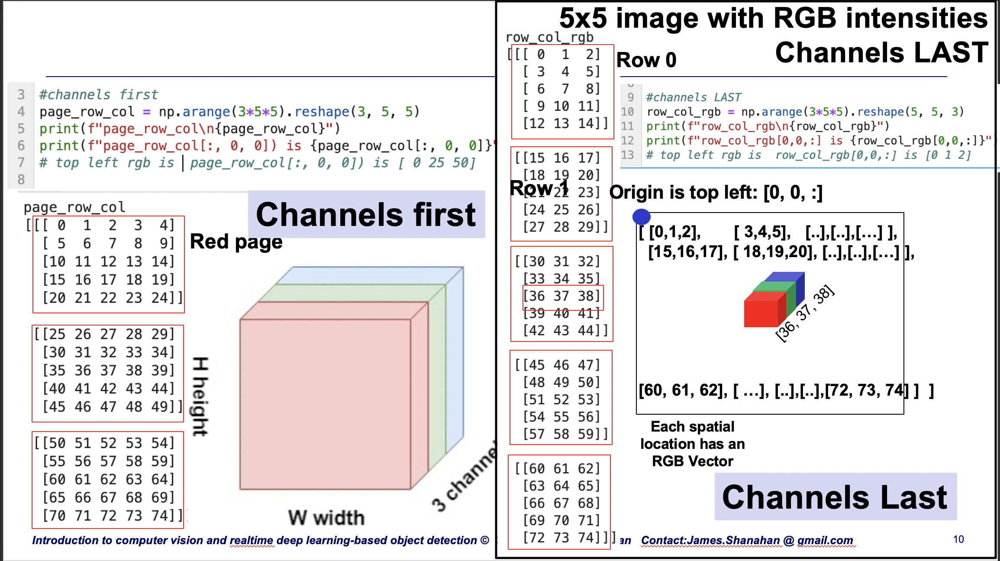

In [109]:
#channels LAST
row_col_rgb = np.arange(3*5*5).reshape(5, 5, 3)
print(f"row_col_rgb\n{row_col_rgb}")
print(f"row_col_rgb[0,0,:] is {row_col_rgb[0,0,:]}")
# top left rgb is  row_col_rgb[0,0,:] is [0 1 2]

row_col_rgb
[[[ 0  1  2]
  [ 3  4  5]
  [ 6  7  8]
  [ 9 10 11]
  [12 13 14]]

 [[15 16 17]
  [18 19 20]
  [21 22 23]
  [24 25 26]
  [27 28 29]]

 [[30 31 32]
  [33 34 35]
  [36 37 38]
  [39 40 41]
  [42 43 44]]

 [[45 46 47]
  [48 49 50]
  [51 52 53]
  [54 55 56]
  [57 58 59]]

 [[60 61 62]
  [63 64 65]
  [66 67 68]
  [69 70 71]
  [72 73 74]]]
row_col_rgb[0,0,:] is [0 1 2]


## Image representations in popular vision libraries
Images can be loaded into and stored in memory using a variety of libraries. In this notebook, you will be learning about how to load, represent, perform operations on,  and manipulate images using a variety of common libraries:

* Matplotlib library (channels last, in RGB order, origin is on the top left corner of the image)
* OpenCV2 (channels last, in BGR order (notice the reverse color channel order)); BGR was a choice made for historical reasons and now we have to live with it. This is a tad painful/annoying. OpenCV reads in images in BGR format (instead of RGB) because when OpenCV was first being developed, BGR color format was popular among camera manufacturers and image software providers. Note the origin is on the top left corner of the image)
* Keras (channels last, in RGB order by default but can also support channels first; origin is on the top left corner of the image))
* Pillow library (weird format: Column, Row, channels last format; origin is on the top left corner of the image))


## Load an image using matplotlib  (directly as a channels last numpy array: row, column, RGB)
We will use the Matplotlib library to load the same image and display it in the Matplotlib frame. Just like PIL, it has the image class that performs the same function. Functions used in this piece of code are imread(), which loads the image in the form of an array of the pixel and imshow(), which displays that image.

We will use the pyplot class from the Matplotlib library to plot the image into the frame.

### `imread()`: load images to a numpy array directly using `matplotlib.imread()`
`imread()` function  loads the image as
a numpy array of pixels directly.

The following code loads an image 

```python
from matplotlib import image
import matplotlib.pyplot as plt
# NOTE:  load image via matplotlib
img = image.imread(img_name)
# NOTE:  plot image via matplotlib
fig, axs = plt.subplots(1, 1, figsize=(8,8)) 
axs.imshow(img) # visualize an array-like or PIL image
axs.set(title=f'RGB image: numpy format (row, col, RGB):{img.shape}')
```

In [152]:
import cv2
import matplotlib as mpl
from matplotlib import image
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
plt.style.use('fivethirtyeight')

img_name = 'SF_golden_gate_bridge_3648x2736.jpg'

img = image.imread(img_name)
print(f"Numpy Array shape {img.shape}")
print(f"image type {type(img)} of {img.dtype}")
print(f"first 4 pixels in the first row (top left of the image):{img[:1, :4]}")
print(f"\nfirst 4 pixels in the first four rows (top left corner patch of the image):{img[:4, :4]}")

Numpy Array shape (2736, 3648, 3)
image type <class 'numpy.ndarray'> of uint8
first 4 pixels in the first row (top left of the image):[[[204 218 229]
  [204 218 229]
  [205 219 230]
  [204 218 229]]]

first 4 pixels in the first four rows (top left corner patch of the image):[[[204 218 229]
  [204 218 229]
  [205 219 230]
  [204 218 229]]

 [[203 217 228]
  [204 218 229]
  [204 218 229]
  [204 218 229]]

 [[204 218 229]
  [204 218 229]
  [204 218 229]
  [204 218 229]]

 [[205 219 230]
  [205 219 230]
  [205 219 230]
  [205 219 230]]]


[Text(0.5, 1.0, 'RGB image: numpy format (row, col, RGB):(2736, 3648, 3)')]

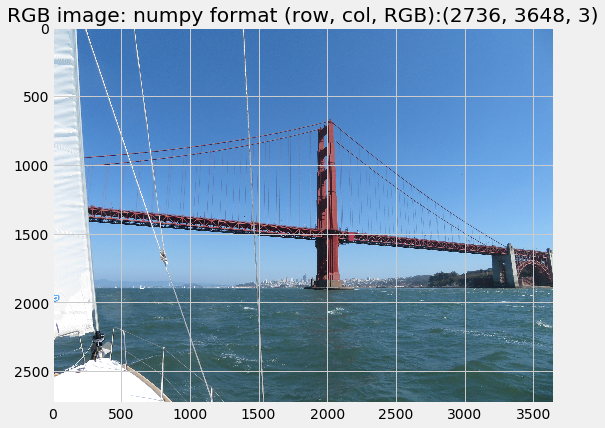

In [81]:
import cv2
import matplotlib as mpl
from matplotlib import image
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
plt.style.use('fivethirtyeight')

img_name = 'SF_golden_gate_bridge_3648x2736.jpg'

# NOTE:  load image via matplotlib
img = image.imread(img_name)
# NOTE:  plot image via matplotlib
fig, axs = plt.subplots(1, 1, figsize=(8,8)) 
axs.imshow(img) # visualize an array-like or PIL image
axs.set(title=f'RGB image: numpy format (row, col, RGB):{img.shape}')


### Plot numpy arrays using plt.imshow(numpy_array)

[Text(0.5, 1.0, 'RGB img[:,:1000,:]: numpy format (row, col, RGB):(2736, 1000, 3)')]

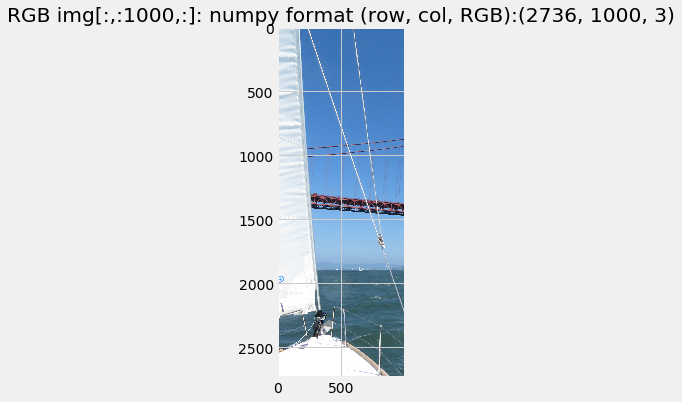

In [80]:
from matplotlib import image
import matplotlib.pyplot as plt
from numpy import asarray
# NOTE:  load image via matplotlib
img = image.imread(img_name) #numpy array
# NOTE:  plot image via matplotlib
fig, axs = plt.subplots(1, 1, figsize=(6,6)) 
axs.imshow(img[:,:1000,:]) # visualize an array-like or PIL image
axs.set(title=f'RGB img[:,:1000,:]: numpy format (row, col, RGB):{img[:,:1000,:].shape}')


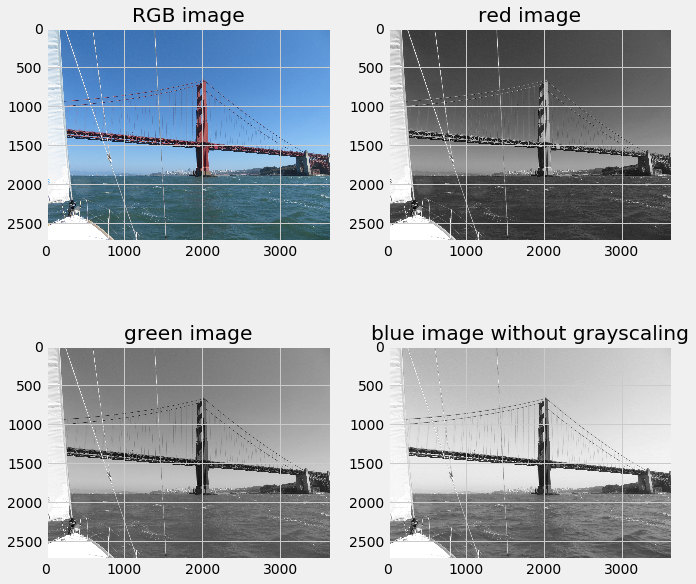

In [135]:
import matplotlib as mpl
from matplotlib import image
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import numpy as np
# load image via matplotlib
img_name = 'SF_golden_gate_bridge_3648x2736.jpg'
img = image.imread(img_name)

#show  images and its RGB channels
fig, axs = plt.subplots(2, 2, figsize=(10,10)) # figsize=(15, 1) width x height
axs[0,0].imshow(img)
axs[0, 1].imshow(img[:,:,0], cmap='gray')
axs[1, 0].imshow(img[:,:,1], cmap='gray')
axs[1, 1].imshow(img[:,:,2], cmap='gray')
axs[0, 0].set(title='RGB image')
axs[0, 1].set(title='red image');
axs[1, 0].set(title='green image');
axs[1, 1].set(title='blue image without grayscaling');
#plt.show()

## Keras Tensorflow image tensors are `channels_last` by default
Tensorflow, pyTorch, Theano (no longer used) principal data data structure is a tensor, which is essentially a multidimensional array data structure.  All data, models, all inputs and outputs are represented as **tensors**. 

Tensorflow supports different dimension orders inside a tensor for image data in particular, which is visible via a call to Keras backend via `K.image_data_format()`. It supports two formats `channels_first` (channel, row, column), and `channels_last` (row, column, channel). These correspond to ordering for Theano and Tensorflow style tensors respectively. One can change the ordering setting as follows to `channels_last` the default setting for Tensorflow: 
```python 
K.set_image_data_format('channels_last')
```  

If the `K.image_data_format()` is set to `channels_first` (i.e., the Theano tensor format) data tensors for images will be 4-dimensional in nature: **(Objects, Channels, Image rows,Image columns)**. Assume that $\text{X_train}$ is the input image training  tensor. Then $\text{X_train}[0]$ gives you one training object - it is an image with a few channels in the general case. $\text{X_train}[0][0]$ gives you the first channel of the first object, $\text{X_train}[0][1]$ gives you the second channel (if it exists),  and so on. 

In Tensorflow the order for an input image data tensor is as follows: **(Objects, Image rows,Image columns, Channels)**

When working with Keras, one can cross check the tensor dimension order for the Tensorflow backend to avoid any surprises and reshape and expand the grayscale image data as follows (here imagine we are using the  MNIST digits data here):

```python
import numpy as np
import pandas as pd
from keras.datasets import mnist
from sklearn.model_selection import train_test_split

(X_train, y_train), (X_test, y_test) = mnist.load_data()
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.20, random_state=42)
img_rows, img_cols = 28, 28
number_of_classes = 10

if K.image_dim_ordering() == 'th':
    X_train = X_train.reshape(X_train.shape[0], 1, img_rows, img_cols)
    X_valid = X_valid.reshape(X_valid.shape[0], 1, img_rows, img_cols)
    X_test  = X_test.reshape( X_test.shape[0],  1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    X_train = X_train.reshape(X_train.shape[0], img_rows, img_cols, 1)
    X_valid = X_valid.reshape(X_valid.shape[0], img_rows, img_cols, 1)
    X_test = X_test.reshape(X_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
```    

# OpenCV (we will be using OpenCV2) 

[OpenCV](https://opencv.org/) (available at https://opencv.org/ ) is one of the most popular computer vision, real-time image processing, open source libraries and can be installed on all major platforms including Linux, macOS,
Windows, Android, iOS, and so on. The library itself is written in C/C++, but Python bindings are provided when running the installer. V1.0 was released in 1999, V2.0 was released in 2009 with incredible NumPy support. 
 
OpenCV2 is awesome but it does have a learning curve and is one of the go-to libraries image capture, image creation,  image manipulation, image processing, image image understanding, and realtime deployment of such systems. With the advent of end-to-end deep learning pipelines for more advanced vision applications (deployed, embedded or otherwise),  OpenCV has become more of a baseline and sometimes the glue that ties such pipelines together.

<p>OpenCV's application areas include:
</p>
<ul><li>2D and 3D feature toolkits</li>
<li><a href="/wiki/Egomotion" class="mw-redirect" title="Egomotion">Egomotion</a> estimation</li>
<li><a href="/wiki/Facial_recognition_system" title="Facial recognition system">Facial recognition system</a></li>
<li><a href="/wiki/Gesture_recognition" title="Gesture recognition">Gesture recognition</a></li>
<li><a href="/wiki/Human%E2%80%93computer_interaction" title="Human–computer interaction">Human–computer interaction</a> (HCI)</li>
<li><a href="/wiki/Mobile_robotics" class="mw-redirect" title="Mobile robotics">Mobile robotics</a></li>
<li>Motion understanding</li>
<li>Object identification</li>
<li><a href="/wiki/Segmentation_(image_processing)" class="mw-redirect" title="Segmentation (image processing)">Segmentation</a> and recognition</li>
<li><a href="/wiki/Stereopsis" title="Stereopsis">Stereopsis</a> stereo vision: depth perception from 2 cameras</li>
<li><a href="/wiki/Structure_from_motion" class="mw-redirect" title="Structure from motion">Structure from motion</a> (SFM)</li>
<li><a href="/wiki/Video_tracking" title="Video tracking">Motion tracking</a></li>
<li><a href="/wiki/Augmented_reality" title="Augmented reality">Augmented reality</a></li></ul>
<p>To support some of the above areas, OpenCV includes a statistical <a href="/wiki/Machine_learning" title="Machine learning">machine learning</a> library that contains:
</p>
<ul><li><a href="/wiki/Boosting_(meta-algorithm)" class="mw-redirect" title="Boosting (meta-algorithm)">Boosting</a></li>
<li><a href="/wiki/Decision_tree_learning" title="Decision tree learning">Decision tree learning</a></li>
<li><a href="/wiki/Gradient_boosting" title="Gradient boosting">Gradient boosting</a> trees</li>
<li><a href="/wiki/Expectation-maximization_algorithm" class="mw-redirect" title="Expectation-maximization algorithm">Expectation-maximization algorithm</a></li>
<li><a href="/wiki/K-nearest_neighbor_algorithm" class="mw-redirect" title="K-nearest neighbor algorithm">k-nearest neighbor algorithm</a></li>
<li><a href="/wiki/Naive_Bayes_classifier" title="Naive Bayes classifier">Naive Bayes classifier</a></li>
<li><a href="/wiki/Artificial_neural_network" title="Artificial neural network">Artificial neural networks</a></li>
<li><a href="/wiki/Random_forest" title="Random forest">Random forest</a></li>
<li><a href="/wiki/Support_vector_machine" title="Support vector machine">Support vector machine</a> (SVM)</li>
<li><a href="/wiki/Deep_neural_network" class="mw-redirect" title="Deep neural network">Deep neural networks</a> (DNN)<sup id="cite_ref-DNN_10-0" class="reference"><a href="#cite_note-DNN-10">&#91;10&#93;</a></sup></li></ul>

For more background details see [WikiPedia](https://en.wikipedia.org/wiki/OpenCV) or [OpenCV](https://opencv.org/) . 

## SimpleCV
[SimpleCV](http://simplecv.org/) on the other hand is a framework including several libraries (as far as I know not only OpenCV) and uses Python for scripting. Due to the nature of Python, you can either run scripts or use an interactive shell to do computer vision stuff and related tasks.
SimpleCV library has a substantially smaller learning curve. 

**NOTE: SimpleCV does not support Python3.**


SimpleCV is an open source framework written in Python for building computer vision (CV) applications quickly and easily. It is easy to put CV to work on real-world applicationns using basic CV techniques for collecting, processing, and analyzing streaming digital images. It works seamlessly with Windows, Mac, or Linux system. SimpleCV library has a substantially smaller learning curve. Due to the nature of Python, you can either run scripts or use an interactive shell to do computer vision stuff and related tasks. Here are some of the things you can do easity with SimpleCV

* Capture images from several sources, including webcams, smartphones, and Kinect
* Filter image input so your application processes only necessary information
* Manipulate images by performing basic arithmetic on pixel values
* Use feature detection techniques to focus on interesting parts of an image
* Work with several features in a single image, using the NumPy and SciPy Python libraries
* Provides the ability to do basic optical flow to identify objects that change between two image frames
* Easy to develop applications via SimpleCV’s command line and code editor 

### SimpleCV Hello World` example
The following example adapted from [SimpleCV](http://simplecv.org/) shows a `Hello World` program that uses SimpleCV. In this example we first connect to a USB web camera. We then capture images from the web cam, apply a binary threshold that turns our image black and white, and then draws some text. The program then prints the results to a display.

```python
from SimpleCV import Camera
# Initialize the camera
cam = Camera()
# Loop to continuously get images
while True:
    # Get Image from camera
    img = cam.getImage()
    # Make image black and white
    img = img.binarize()
    # Draw the text "Hello World" on image
    img.drawText("Hello World!")
    # Show the image
    img.show()
```

A sample input-output montage of the above code is shown below:

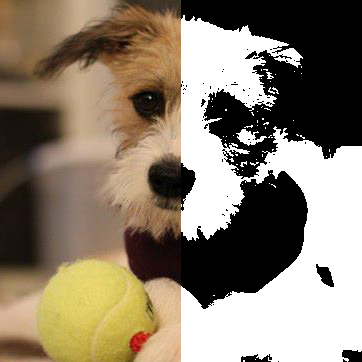

### A simple Canny edge detector demo using SimpleCV.

In [114]:
# ! pip -q install SimpleCV
# NOTE SimpleCV does not support Python 3 

You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


In [ ]:
from SimpleCV import Image

# Make a function that does a half and half image.
def halfsies(left,right): 
    result = left
    # crop the right image to be just the right side.
    crop   = right.crop(right.width/2.0,0,right.width/2.0,right.height)
    # now paste the crop on the left image.
    result = result.blit(crop,(left.width/2,0))
    # return the results.
    return result
# Load an image from imgur.
img = Image('http://i.imgur.com/lfAeZ4n.png')
# create an edge image using the Canny edge detector
# set the first threshold to 160
output = img.edges(t1=160)
# generate the side by side image.
result = halfsies(img,output)
# show the results.
result.show()
# save the output images. 
result.save('juniperedges.png')

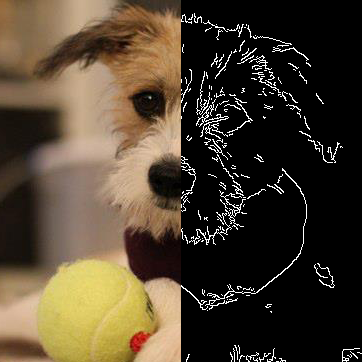

## OpenCV or SimpleCV: which one to choose? [HINT: OpenCV]
OpenCV is the way to go if you have time and are curious about image creation, processing, and understanding. It is the defacto library for dealing with images and deployed images applications. For quick prototyping (and if you have limited Python programming experience)  SimpleCV is far superior, but for actual implementation/usage, OpenCV offers a lot more possibilities (although at a higher complexity; e.g. being able to be included in native applications as well as embedded systems).

## Installing OpenCV2

In [1]:
# https://pypi.org/project/opencv-python/
#!pip3 install opencv-python
#!conda  install -y opencv 

# USE the following 3 lines
#!apt-get update
#!apt-get install -y libsm6 libxext6 libxrender-dev
#!pip3 install opencv-contrib-python

Hit:1 http://security.debian.org/debian-security stretch/updates InRelease
Ign:2 http://deb.debian.org/debian stretch InRelease
Hit:3 http://deb.debian.org/debian stretch-updates InRelease
Hit:4 http://deb.debian.org/debian stretch Release 
Reading package lists... Done
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libsm6 is already the newest version (2:1.2.2-1+b3).
libxext6 is already the newest version (2:1.3.3-1+b2).
libxrender-dev is already the newest version (1:0.9.10-1).
0 upgraded, 0 newly installed, 0 to remove and 12 not upgraded.
You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


## Matplotlib expects img in RGB format but OpenCV provides it in BGR

The OpenCV library and provides `cv2.imread()` function  to load
an image from disk in BGR form.


```
(b, g, r) = image[20, 100] # accesses pixel at x=100, y=20
(b, g, r) = image[75, 25] # accesses pixel at x=25, y=75
(b, g, r) = image[90, 85] # accesses pixel at x=85, y=90
```

 OpenCV provides the `imshow()` method to render an image in a separate window. This does not work well with Jupyter in Docker mode. So it is best one uses Matplotlib.image to `matplotlib.pyplot.imshow()` to show an image with the notebook. Matplotlib expects an image  in `RGB` format but OpenCV provides it in `BGR`. So the OpenCV formatted image object needs to be reformatted to work with mathplotlib.

```python
cv2.imshow("Image", image)
```

To render an image within a jupyter notebook inside a Docker Container, 

```python
# One more example for displaying a color image.
# Matplot lib expects img in RGB format but OpenCV provides it in BGR.

RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
plt.imshow(RGB_img)

```

(2736, 3648, 3)
<class 'numpy.ndarray'>
uint8
[[[229 218 204]
  [229 218 204]
  [230 219 205]
  [229 218 204]
  [229 218 204]]

 [[228 217 203]
  [229 218 204]
  [229 218 204]
  [229 218 204]
  [228 217 203]]

 [[229 218 204]
  [229 218 204]
  [229 218 204]
  [229 218 204]
  [229 218 204]]

 [[230 219 205]
  [230 219 205]
  [230 219 205]
  [230 219 205]
  [230 219 205]]

 [[229 220 206]
  [228 219 205]
  [228 219 205]
  [228 219 205]
  [229 220 206]]]


Text(0.5, 1.0, 'SF_golden_gate_bridge_3648x2736')

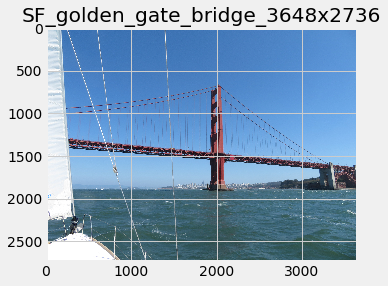

In [15]:
import cv2
import matplotlib as mpl
from matplotlib import image
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import numpy as np
img_name = 'SF_golden_gate_bridge_3648x2736.jpg'

image = cv2.imread(img_name)
print(image.shape)
# Check the resulting img
print (type(image))
print (image.dtype)
print (image[:5, :5, :3])  # Right-upper-most few pixels of the image

# One more example for displaying a color image.
# Matplot lib expects img in RGB format but OpenCV provides it in BGR.

RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#cv2.imshow("Image", image)
#cv2.waitKey(0)

plt.imshow(RGB_img)
plt.title('SF_golden_gate_bridge_3648x2736')


## Basic operations on Images

### Draw things on a canvas 

- `cv2.line(image, startPoint, endPoint, rgb, thinkness)`
- `cv2.rectangle(image, topLeft, bottomRight, rgb, thinkness)`
- `cv2.circle(image, center, radius, rgb, thinkness)`
- `cv2.ellipse(image, center, axes, angle, startAngle, endAngle, rgb, thinkness)`

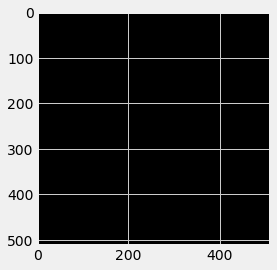

In [124]:
# Create a black image
img2 = np.zeros((512,512,3), np.uint8)
plt.imshow(img2)

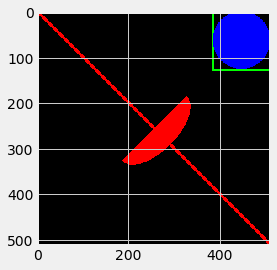

In [125]:
# Draw a line using cv2.line(image, startPoint, endPoint, rgb, thinkness)
cv2.line(img2, (0,0), (511,511), (255,0,0), 5)
# => Diagonal red line with thickness of 5 px

# Draw a rectangle using cv2.rectangle(image, topLeft, bottomRight, rgb, thinkness)
cv2.rectangle(img2, (384,0), (510,128), (0,255,0), 3)
# => Green rectangle with thickness of 3 px

# Draw a circle using cv2.circle(image, center, radius, rgb, thinkness)
cv2.circle(img2, (447,63), 63, (0,0,255), -1)
# => Blue filled circle(note that the thinkness is -1)

# Draw a ellipse using cv2.ellipse(image, center, axes, angle, startAngle, endAngle, rgb, thinkness)
cv2.ellipse(img2, (256,256), (100,50), -45, 0, 180, (255,0,0), -1)
# => Red wide down-half ellipse

plt.imshow(img2)

[[[ 10  10]]

 [[150 200]]

 [[300 150]]

 [[200  50]]]


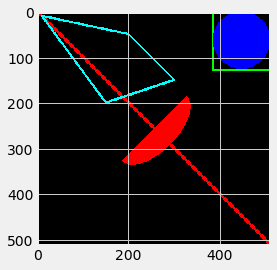

In [126]:
# Draw a line using cv2.polylines(image, points, isClosed, rgb, thinkness, lineType, shift)
pts = np.array([[10,10],[150,200],[300,150],[200,50]], np.int32)
pts = pts.reshape((-1,1,2))
cv2.polylines(img2,[pts],True,(0,255,255),3)
# => Cyan closed quadrangle 

print(pts)
plt.imshow(img2)

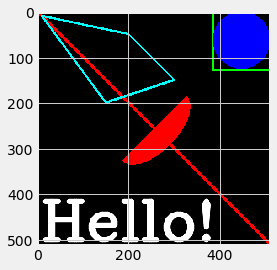

In [127]:
# Put some text using cv2.putText(image, text, bottomLeft, fontType, fontScale, rgb, thinkness, lineType)
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2, 'Hello!', (10,500), font, 4, (255,255,255), 10, cv2.LINE_AA)
# => White 'Hello' text at the bottom

plt.imshow(img2)

### Canny Edge detection

Below is an example of  will finding  edges  using the classic Canny edge detector(cv2.Canny()). 

`edges = cv2.Canny(image, threshold1, threshold2, apatureSize=3, L2gradient=False)`

- `image`: 8-bit grayscale input image
- `threshold1`/`threshold2`: thresholds for the hysteresis procedure
- `apertureSize`: aperture size for the `Sobel()` operator
- `L2gradient`: A flag. `True` to use $L_2$-norm of gradients. $L_1$-norm for `False`

An even more classic edge detector is the Sobel operator(cv2.Sobel()); this is not presented here.

In [128]:
!wget http://i.imgur.com/lfAeZ4n.png -O puppy.png

wget: /usr/local/lib/libuuid.so.1: no version information available (required by wget)
--2020-07-27 15:58:39--  http://i.imgur.com/lfAeZ4n.png
Resolving i.imgur.com (i.imgur.com)... 151.101.24.193
Connecting to i.imgur.com (i.imgur.com)|151.101.24.193|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://i.imgur.com/lfAeZ4n.png [following]
--2020-07-27 15:58:39--  https://i.imgur.com/lfAeZ4n.png
Connecting to i.imgur.com (i.imgur.com)|151.101.24.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 156012 (152K) [image/png]
Saving to: 'puppy.png'

puppy.png           100%[===================>] 152.36K  --.-KB/s    in 0.09s   

2020-07-27 15:58:39 (1.65 MB/s) - 'puppy.png' saved [156012/156012]



type: <class 'numpy.ndarray'>
dtype: uint8
shape: (2736, 3648, 3)


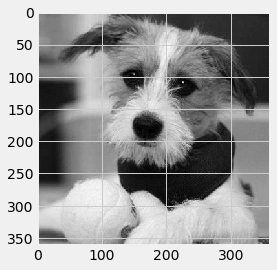

In [142]:
# Load an image into grayscale
img_name_pup = "puppy.png" 
img_pup = cv2.imread(img_name_pup, cv2.IMREAD_GRAYSCALE)  # input_image: 2-dim array
print('type: ' + str(type(img)))
print('dtype: ' + str(img.dtype))
print('shape: ' + str(img.shape))

plt.imshow(img_pup, cmap='gray')  # Make sure that the plot is drawn in grayscale

(-0.5, 361.5, 361.5, -0.5)

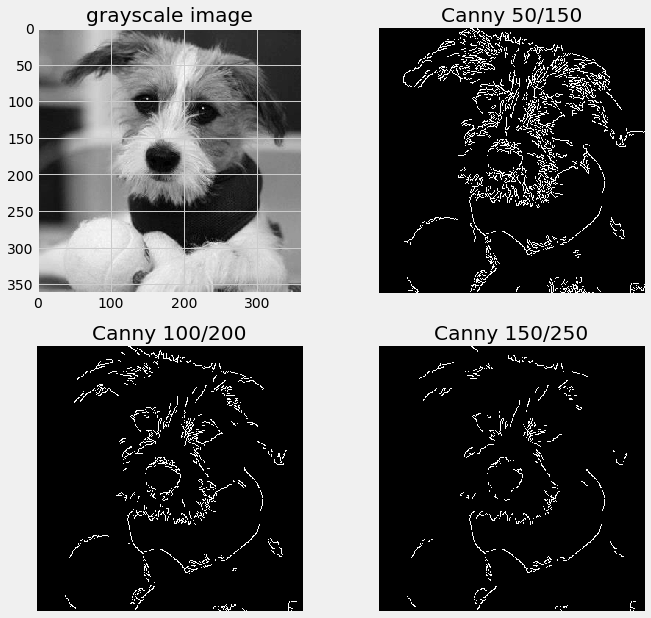

In [143]:
# Canny edge detection with the various thresholds
canny1 = cv2.Canny(img_pup, 50, 150)
canny2 = cv2.Canny(img_pup, 100, 200)
canny3 = cv2.Canny(img_pup, 150, 250)

# plot all images using the matplotlib oop interface
#show  images and its RGB channels
fig, axs = plt.subplots(2, 2, figsize=(10,10)) # figsize=(15, 1) width x height
axs[0,0].imshow(img_pup,  cmap='gray')
axs[0, 1].imshow(canny1, cmap='gray')
axs[1, 0].imshow(canny2, cmap='gray')
axs[1, 1].imshow(canny3, cmap='gray')
axs[0, 0].set(title='grayscale image')
axs[0, 1].set(title='Canny 50/150');  axs[0,1].axis('off')  
axs[1, 0].set(title='Canny 100/200'); axs[1,0].axis('off')
axs[1, 1].set(title='Canny 150/250'); axs[1,1].axis('off')


## opencv-tutorial
A short tutorial on OpenCV-Python is available  [here](https://github.com/dalgu90/opencv-tutorial):

Tutorial index
* OpenCV-Python Getting Startedm
* Edge Detection
* Feature Extraction & Matching
* Geometric Transformation & Homography
* Face Detection with Cascade Classifier
* Object Classification with VBoW
* Object Tracking
* (Practice Test) - SIFT Mosaic / Face & Eye Detection

Below is a sample of the results one can get using a SIFT feature-based face and eye detector. This example is provided as part of the above tutorial series [here](https://github.com/dalgu90/opencv-tutorial).

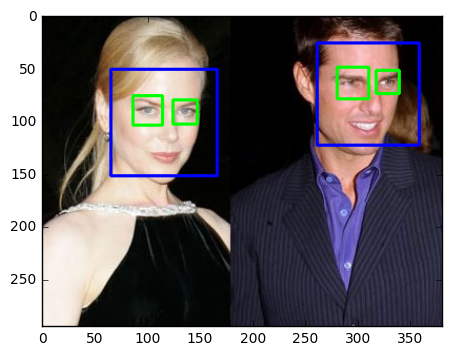

# Python image library(PIL): from PIL (Python 2X) to  Pillow library (Python 3X)
Pillow is an updated version of the Python Image Library, or PIL, and supports a range of simple and sophisticated image manipulation functionality. 
* The **Python Imaging Library**, or PIL for short, is an open source library for loading and manipulating images. It was developed and made available more than 25 years ago and has become a de facto standard API for working with images in Python. The library is now defunct and no longer updated and does not support Python 3. 
* **Pillow** is a PIL library that supports Python 3 and is the preferred modern library for image manipulation in Python. It is even required for simple image loading and saving in other Python scientific libraries such as SciPy and Matplotlib.

It is also the basis for simple image support in other Python libraries such as SciPy and Matplotlib. 



In [ ]:
#! pip -q install Pillow

In [4]:
# check PIL and Pillow version numbers
import PIL  #import the Pillow package
print('Pillow Version:', PIL.__version__)   # latest version is Pillow Version: 7.2

Pillow Version: 7.0.0


## Some of Pillow's functionality

The `Image` module is quite useful.  It provides access to many useful image processing operations:

```python
from PIL import Image 
im = Image.open('SF_golden_gate_bridge_3648x2736.jpg') #Read in the image

im.rotate(45)   #Returns a rotated image, 45 degrees

im.crop(box)  # Returns a copy of a rect. sub-region  

im.filter(filter) #Returns a copy of an image filtered by the given 
#filter. For a list of available filters, see the ImageFilter module.

im.load() #Returns a high speed pixel access object.

im.resize() # Returns the image resized.

im.save(“Name”) #Save the image into file “Name”
```

The following sections provide examples of using some these image processing operations.

## Load an image via Pillow or Matplotlib
Images can be loaded into and stored in memory using a variety of libraries. in this section, you will learning about how to load images using a variety of common libraries:

* Pillow library
* Matplotlib library

This section focuses loading, saving, and  getting  details of an image using: 
* Pillow library
* and using Matplotlib library.

### Method 1: Load an image using Pillow
Load a JPEG  (or PNG) using the Pillow library. The `Image` class is the heart of PIL, and its properties help manipulate the pixels, format, and contrast of the image.

In [10]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

The format attribute identifies the source of an image (e.g. JPEG). If the image was not read from a file, it is set to None. The size attribute is a 2-tuple containing width and height (e.g. 3,648 × 2,736  pixels in width and height). The mode attribute defines the number and names of the bands in the image, and also the pixel type and depth. Common modes are “L” (luminance) for greyscale images, “RGB” for true color images, and “CMYK” for pre-press images.


MPO (3648, 2736) RGB


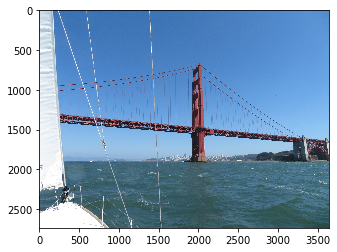

In [17]:
# load and show an image with Pillow
from PIL import Image
# load the following image
img_name = 'SF_golden_gate_bridge_3648x2736.jpg'
im = Image.open(img_name)
# summarize some details about the image
print(im.format, im.size, im.mode) #notice that image is organized using the Cartesian coordinate space columns x rows x RGB with an origin on the top left
# show the image
#im.show() #does not work in Jupyter mode without a lot of work
plt.imshow(im)

The Image class uses these functions:

* LOAD: `open()`: This can directly load the image. It has `info` properties like:

  * `format`, which gives information about the digital file format of an image, 
  *`mode` which gives a piece of information about pixel format (e.g., RGB or L),   
  * and `size`, which displays the dimensions of the image in pixels (e.g., 480x240).


* DISPLAY :`show()`: This will display the image. Your default photo preview application will pop up. This method does not work in Jupyter mode without a lot of work. 

#### Use matplotlib.image package `plt.imshow()` to display images
So `matplotlib.pyplot.imshow(imagename)` is used to show an image as follows: 


```python
# load and show an image with Pillow
from PIL import Image
import matplotlib.pyplot as plt
img_name = 'SF_golden_gate_bridge_3648x2736.jpg'
im = Image.open(img_name)
plt.imshow(im)
```

`matplotlib` is an extremely versatile library to not only displaying images, but also loading images (as numpy arrays):

```python
import matplotlib.pyplot as plt
from matplotlib import image
img = image.imread(img_name)         # load image as a numpy array
print(f"Numpy Array shape {img.shape}")
print(f"image type {type(numpy_img)} of {numpy_img.dtype}")
plt.imshow(imagename)                # display numpy array
```


#### Load an image using Pillow and display, convert to numpy array
##### How to convert a PIL image to NumPy array (Row, Col, RGB) (Height, Width, Color) and back

Running the example below loads the image and then converts it to a numpy representation. It also reports the data type of the array, in
this case, 8-bit unsigned integers, then reports the shape of the array, in this case, (2736, 3648, 3) 2736 pixels
high by 3648 pixels wide and three channels for red, green, and blue.

**From a PIL style image to a numpy array and back**
```python
from PIL import Image
from numpy import asarray
image = Image.open(img_name)
# convert a PIL image to a numpy array
numpy_img = asarray(image)

# create a Pillow image from numpy array
image2 = Image.fromarray(numpy_img)
```

Pillow image spatial size (3648, 2736)
Numpy Array shape (2736, 3648, 3)
image type <class 'numpy.ndarray'> of uint8
image2.format:None
image2.mode:RGB
Pillow image shape (3648, 2736)
show the top left hand (5x5 spatially) corner RGB intensity values, i.e., a matrix of 5x5x3.
[[[204 218 229]
  [204 218 229]
  [205 219 230]
  [204 218 229]
  [204 218 229]]

 [[203 217 228]
  [204 218 229]
  [204 218 229]
  [204 218 229]
  [203 217 228]]

 [[204 218 229]
  [204 218 229]
  [204 218 229]
  [204 218 229]
  [204 218 229]]

 [[205 219 230]
  [205 219 230]
  [205 219 230]
  [205 219 230]
  [205 219 230]]

 [[206 220 229]
  [205 219 228]
  [205 219 228]
  [205 219 228]
  [206 220 229]]]


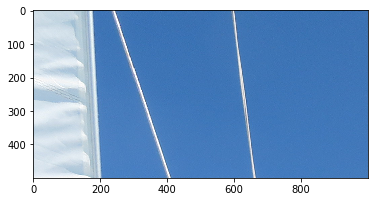

In [41]:
# load image and convert to and from NumPy array
from PIL import Image
from numpy import asarray
# load the image
image = Image.open(img_name)
print(f"Pillow image spatial size {image.size}")
# convert image to numpy array
numpy_img = asarray(image)
# summarize shape
print(f"Numpy Array shape {numpy_img.shape}")
print(f"image type {type(numpy_img)} of {numpy_img.dtype}")

# create a Pillow image from numpy array
image2 = Image.fromarray(numpy_img)
# summarize image details
print(f"image2.format:{image2.format}")
print(f"image2.mode:{image2.mode}")
print(f"Pillow image shape {image2.size}")
#show the top left hand (500x1000 spatially) corner RGB intensity values, i.e., a matrix of 5x5x3. 
plt.imshow(numpy_img[:500, :1000, :3]) 
#show the top left hand (5x5 spatially) corner RGB intensity values, i.e., a matrix of 5x5x3. 
print(f"show the top left hand (5x5 spatially) corner RGB intensity values, i.e., a matrix of 5x5x3.\n{numpy_img[:5, :5, :3]}")  


### Method 2: Load an image using matplotlib (directly as a numpy array: row, column, RGB)
We will use the Matplotlib library to load the same image and display it in the Matplotlib frame. Just like PIL, it has the image class that performs the same function. Functions used in this piece of code are imread(), which loads the image in the form of an array of the pixel and imshow(), which displays that image.

We will use the pyplot class from the Matplotlib library to plot the image into the frame.

##### `imread()`: load images to a numpy array directly using `matplotlib.imread()`
`imread()` function  loads the image as
a numpy array of pixels directly.

In [53]:
from matplotlib import image
img = image.imread(img_name)
print(f"Numpy Array shape {img.shape}")
print(f"image type {type(img)} of {img.dtype}")
img[:4, :4]

Numpy Array shape (2736, 3648, 3)
image type <class 'numpy.ndarray'> of uint8


array([[[204, 218, 229],
        [204, 218, 229],
        [205, 219, 230],
        [204, 218, 229]],

       [[203, 217, 228],
        [204, 218, 229],
        [204, 218, 229],
        [204, 218, 229]],

       [[204, 218, 229],
        [204, 218, 229],
        [204, 218, 229],
        [204, 218, 229]],

       [[205, 219, 230],
        [205, 219, 230],
        [205, 219, 230],
        [205, 219, 230]]], dtype=uint8)

[Text(0.5, 1.0, 'RGB image: numpy format (row, col, RGB):(2736, 3648, 3)')]

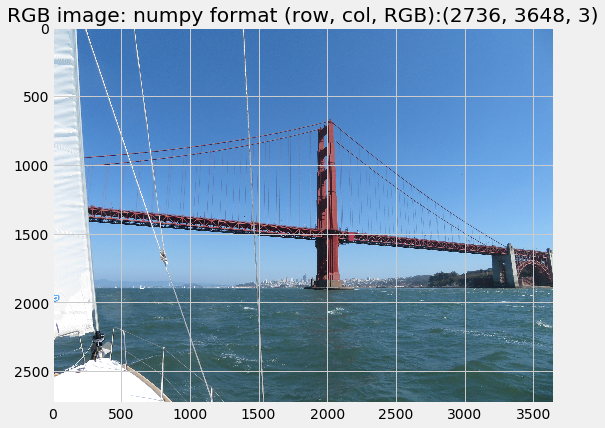

In [81]:
from matplotlib import image
import matplotlib.pyplot as plt
# NOTE:  load image via matplotlib
img = image.imread(img_name)
# NOTE:  plot image via matplotlib
fig, axs = plt.subplots(1, 1, figsize=(8,8)) 
axs.imshow(img) # visualize an array-like or PIL image
axs.set(title=f'RGB image: numpy format (row, col, RGB):{img.shape}')


[Text(0.5, 1.0, 'RGB img[:,:1000,:]: numpy format (row, col, RGB):(2736, 1000, 3)')]

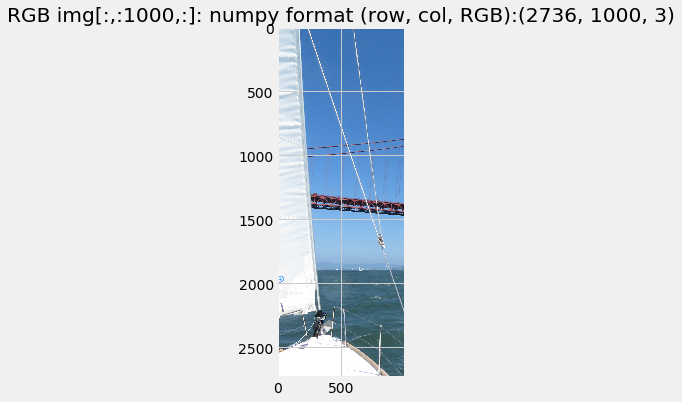

In [80]:
from matplotlib import image
import matplotlib.pyplot as plt
from numpy import asarray
# NOTE:  load image via matplotlib
img = image.imread(img_name) #numpy array
# NOTE:  plot image via matplotlib
fig, axs = plt.subplots(1, 1, figsize=(6,6)) 
axs.imshow(img[:,:1000,:]) # visualize an array-like or PIL image
axs.set(title=f'RGB img[:,:1000,:]: numpy format (row, col, RGB):{img[:,:1000,:].shape}')


##### Plot numpy arrays using plt.imshow(numpy_array)

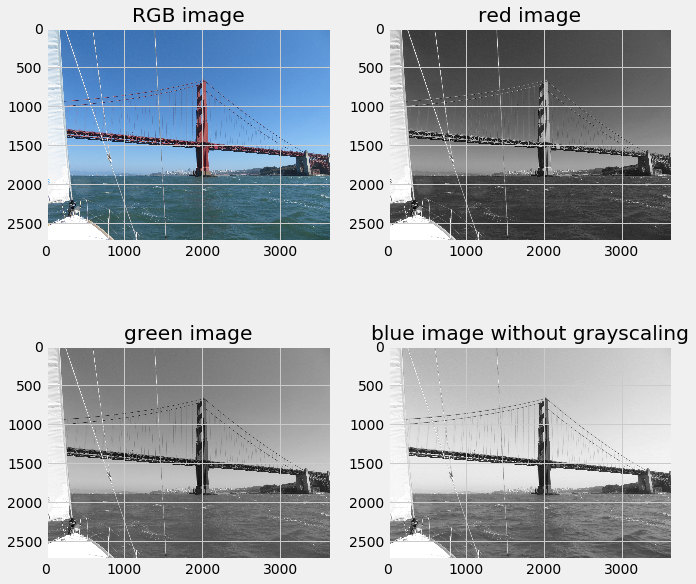

In [135]:
import matplotlib as mpl
from matplotlib import image
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import numpy as np
# load image via matplotlib
img_name = 'SF_golden_gate_bridge_3648x2736.jpg'
img = image.imread(img_name)

#show  images and its RGB channels
fig, axs = plt.subplots(2, 2, figsize=(10,10)) # figsize=(15, 1) width x height
axs[0,0].imshow(img)
axs[0, 1].imshow(img[:,:,0], cmap='gray')
axs[1, 0].imshow(img[:,:,1], cmap='gray')
axs[1, 1].imshow(img[:,:,2], cmap='gray')
axs[0, 0].set(title='RGB image')
axs[0, 1].set(title='red image');
axs[1, 0].set(title='green image');
axs[1, 1].set(title='blue image without grayscaling');
#plt.show()

Pillow image spatial size (3648, 2736)
Numpy Array shape (2736, 3648, 3)
image type <class 'numpy.ndarray'> of uint8
image2.format:None
image2.mode:RGB
Pillow image shape (3648, 2736)
show the top left hand (5x5 spatially) corner RGB intensity values, i.e., a matrix of 5x5x3.
[[[204 218 229]
  [204 218 229]
  [205 219 230]
  [204 218 229]
  [204 218 229]]

 [[203 217 228]
  [204 218 229]
  [204 218 229]
  [204 218 229]
  [203 217 228]]

 [[204 218 229]
  [204 218 229]
  [204 218 229]
  [204 218 229]
  [204 218 229]]

 [[205 219 230]
  [205 219 230]
  [205 219 230]
  [205 219 230]
  [205 219 230]]

 [[206 220 229]
  [205 219 228]
  [205 219 228]
  [205 219 228]
  [206 220 229]]]


TypeError: 'MpoImageFile' object is not subscriptable

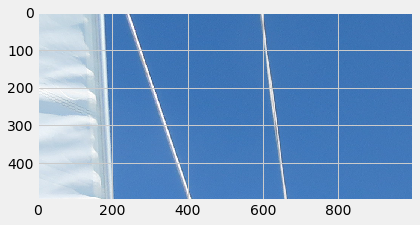

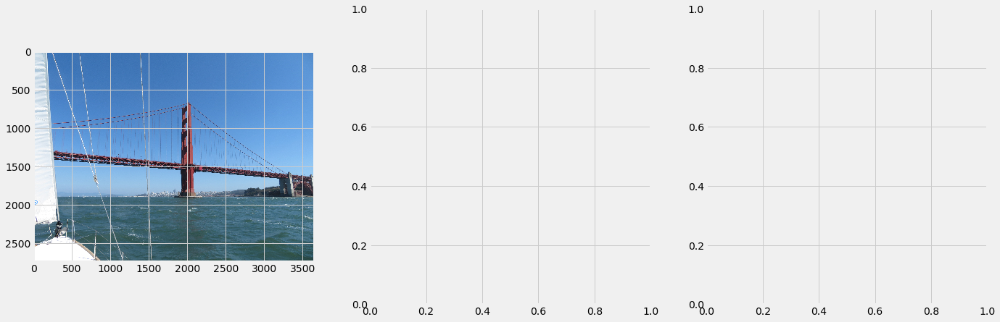

In [82]:
# load image and convert to and from NumPy array
from PIL import Image
from numpy import asarray
# load the image
pil_image = Image.open(img_name)
print(f"Pillow image spatial size {pil_image.size}")
# convert image to numpy array
numpy_img = asarray(pil_image)
# summarize shape
print(f"Numpy Array shape {numpy_img.shape}")
print(f"image type {type(numpy_img)} of {numpy_img.dtype}")

# create a Pillow image from numpy array
image2 = Image.fromarray(numpy_img)
# summarize image details
print(f"image2.format:{image2.format}")
print(f"image2.mode:{image2.mode}")
print(f"Pillow image shape {image2.size}")
#show the top left hand (500x1000 spatially) corner RGB intensity values, i.e., a matrix of 5x5x3. 
plt.imshow(numpy_img[:500, :1000, :3]) 
#show the top left hand (5x5 spatially) corner RGB intensity values, i.e., a matrix of 5x5x3. 
print(f"show the top left hand (5x5 spatially) corner RGB intensity values, i.e., a matrix of 5x5x3.\n{numpy_img[:5, :5, :3]}")  



#show  images and its RGB channels
fig, axs = plt.subplots(1, 3, figsize=(21,7)) 
axs[0].imshow(pil_image) # visualize an array-like or PIL image
axs[1].imshow(pil_image[:,:1000,:]) 
axs[2].imshow(numpy_img[:,:1000,:]) 
axs[0].set(title='Original image')
axs[1].set(title='pil_image[:,:1000,:]');
axs[2].set(title='numpy_img[:,:1000,:]');


### load all images in a directory

In [64]:
# load all images in a directory
import glob
from matplotlib import image

# load all images in a directory
loaded_images_list = list() #track all images in a list
for img_filename in glob.glob("*.jpg"):
    # load images
    img_data = image.imread('./' + img_filename)
    # store loaded image
    loaded_images_list.append(img_data)
    print(f'> loaded {img_filename} of size{img_data.shape}')
print(f"there are {len(loaded_images_list)} files in the images sub folder")

> loaded SF_golden_gate_bridge_3648x2736.jpg of size(2736, 3648, 3) %s
> loaded opera_house_grayscale.jpg of size(360, 640) %s
> loaded img.jpg of size(360, 640) %s
> loaded opera_house.jpg of size(360, 640, 3) %s
> loaded SF_golden_gate_bridge.JPG.jpg of size(2736, 3648, 3) %s
> loaded SF_golden_gate_bridge.jpg of size(2736, 3648, 3) %s
there are 6 files in the images sub folder


In [72]:
img1 = np.arange(30).reshape(3,2,5)
print(f"image: {img1.shape}\n{img1}")
img1[:,:,0]=999
print(f"image: {img1.shape}\n{img1}")

img1 = np.arange(30).reshape(2,5, 3)
print(f"image: {img1.shape}\n{img1}")
img1[:,:,0]=999
print(f"image: {img1.shape}\n{img1}")


#a[:,:,0] *=0
#a[:,:,1] *=0


image: (3, 2, 5)
[[[ 0  1  2  3  4]
  [ 5  6  7  8  9]]

 [[10 11 12 13 14]
  [15 16 17 18 19]]

 [[20 21 22 23 24]
  [25 26 27 28 29]]]
image: (3, 2, 5)
[[[999   1   2   3   4]
  [999   6   7   8   9]]

 [[999  11  12  13  14]
  [999  16  17  18  19]]

 [[999  21  22  23  24]
  [999  26  27  28  29]]]
image: (2, 5, 3)
[[[ 0  1  2]
  [ 3  4  5]
  [ 6  7  8]
  [ 9 10 11]
  [12 13 14]]

 [[15 16 17]
  [18 19 20]
  [21 22 23]
  [24 25 26]
  [27 28 29]]]
image: (2, 5, 3)
[[[999   1   2]
  [999   4   5]
  [999   7   8]
  [999  10  11]
  [999  13  14]]

 [[999  16  17]
  [999  19  20]
  [999  22  23]
  [999  25  26]
  [999  28  29]]]


## Other useful Pillow image operations

Let's look at some other useful image operations in Pillow:

* saving an image
* resize an image
* rotate an image
* crop an image

### Saving an image in another format

In [77]:
# example of saving an image in another format
from PIL import Image
# load the image
image = Image.open(img_name)
print(image.format)
print(image.size)
img_base_name = img_name.split(".")[0]
# save as PNG format
image.save(f'{img_base_name}.png', format='PNG')
# load the image again and inspect the format
image2 = Image.open(f'{img_base_name}.png')
print(image2.format)
print(image2.size)


MPO
(3648, 2736)
PNG
(3648, 2736)


### saving a grayscale version of a loaded image

In [66]:
# example of saving a grayscale version of a loaded image
from PIL import Image
# load the image
image = Image.open(img_name)

img_numpp_array = image.to()
# convert the image to grayscale
gs_image = image.convert(mode='L')
# save grayscale image in jpeg format
img_base_name = img_name.split(".")[0]
gs_image.save('{img_base_name}.jpg')
# load the grayscale image again and show it
image2 = Image.open('{img_base_name}.jpg')

#show both images
fig, axs = plt.subplots(1, 2, figsize=(15, 15)) # figsize=(15, 1) width x height
axs[0].imshow(image)
axs[1].imshow(image2)
axs[0].set(title=f'RGB image: {image.size}')
axs[1].set(title='Grayscale image');

AttributeError: 'MpoImageFile' object has no attribute 'asarray'

### Resize Images: preserve aspect/ratio

It is important to be able to resize images before modeling. Sometimes it is desirable to
thumbnail all images to have the same width or height. This can be achieved with Pillow using
the thumbnail() function. The function takes a tuple with the height and width, and the image
will be resized so that the height and width of the image are equal or smaller than the specified
shape.
For example, the test photograph we have been working with has the width and height of
(640, 360). We can resize it to (100, 100), in which case the largest dimension, in this case, the
width, will be reduced to 100, and the height will be scaled in order to retain the aspect ratio of
the image. The example below will load the photograph and create a smaller thumbnail with a
width and height of 100 pixels.

In this case, the width is reduced to 100 pixels and the height is reduced
to 56 pixels, maintaining the aspect ratio of the original image.

Numpy Array shape (3648, 2736)
Numpy Array shape (100, 75)


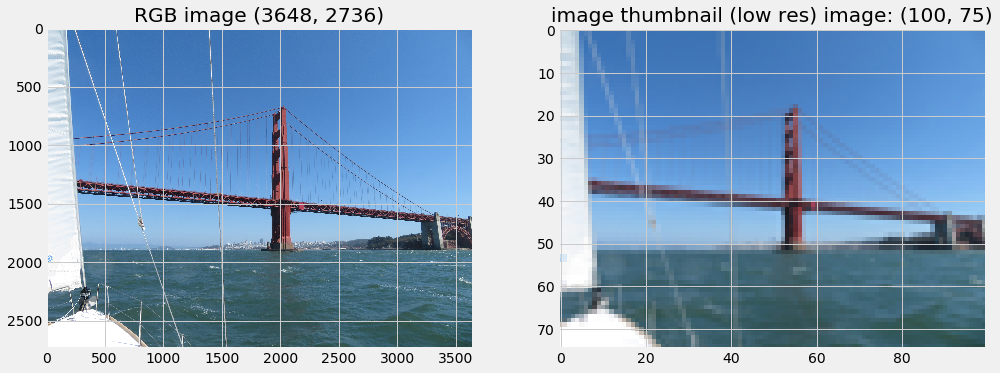

In [116]:
# create a thumbnail of an image
from PIL import Image
from matplotlib import pyplot
# load the image
image = Image.open(img_name)
print(f"original image size in Pillow {image.size}")
# create a thumbnail and preserve aspect ratio
image_thumbnail = image.copy()
image_thumbnail.thumbnail((100,100))
print(f"thumbnail size in Pillow {image_thumbnail.size}")


#show both images
fig, axs = plt.subplots(1, 2, figsize=(15, 15)) # figsize=(15, 1) width x height
axs[0].imshow(image)
axs[1].imshow(image_thumbnail)
axs[0].set(title=f'RGB image {image.size}')
axs[1].set(title=f'image thumbnail (low res) image: {image_thumbnail.size}');


####  Resize Images: do NOT preserve aspect/ratio

The width of the image is squashed to fit in 200 pixels

original image size in Pillow (3648, 2736)
image resized in Pillow (200, 200)


[Text(0.5, 1.0, 'img_resized  image (low res): (200, 200)')]

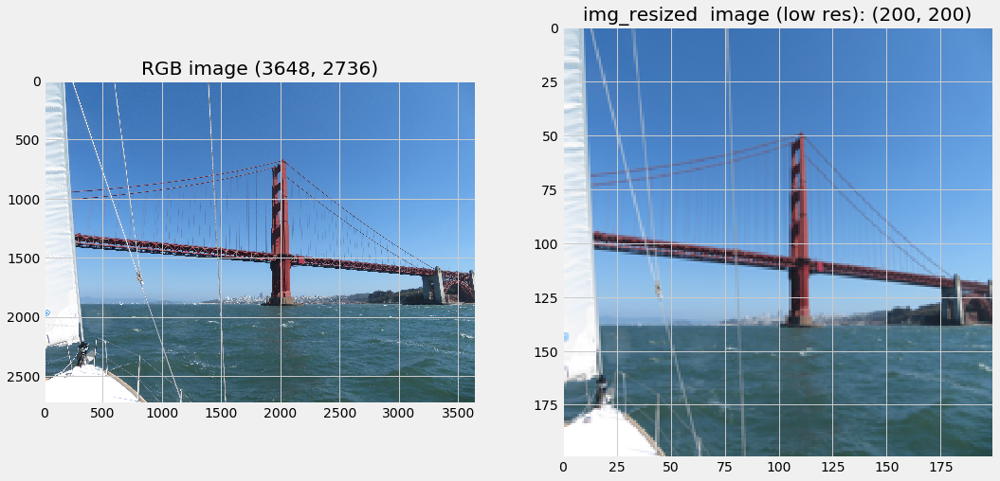

In [121]:
# resize image and force a new shape
from PIL import Image
from matplotlib import pyplot
image = Image.open(img_name)
print(f"original image size in Pillow {image.size}")

# create a thumbnail and preserve aspect ratio
#image_thumbnail = image.copy()
#image_thumbnail.thumbnail((100,100))

# resize image and ignore original aspect ratio
img_resized = image.resize((200,200))
print(f"image resized in Pillow {img_resized.size}")


#show both images
fig, axs = plt.subplots(1, 2, figsize=(16, 8)) 
axs[0].imshow(image)
axs[1].imshow(img_resized)
axs[0].set(title=f'RGB image {image.size}')
axs[1].set(title=f'img_resized  image (low res): {img_resized.size}')

### Pillow: Flip, Rotate, and Crop Images

[Text(0.5, 1.0, 'vertically flipped image (3648, 2736)')]

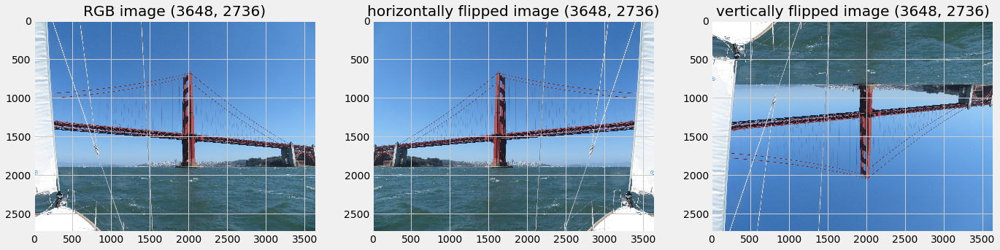

In [48]:
# create flipped versions of an image
from PIL import Image
from matplotlib import pyplot
# load image
image = Image.open(img_name)
# horizontal flip
horizontal_flip = image.transpose(Image.FLIP_LEFT_RIGHT)
# vertical flip
vertical_flip = image.transpose(Image.FLIP_TOP_BOTTOM)
# plot all images using the matplotlib oop interface
fig, axs = plt.subplots(1, 3, figsize=(21, 7)) 
axs[0].imshow(image)
axs[1].imshow(horizontal_flip)
axs[2].imshow(vertical_flip)
axs[0].set(title=f'RGB image {image.size}')
axs[1].set(title=f'horizontally flipped image {horizontal_flip.size}')
axs[2].set(title=f'vertically flipped image {vertical_flip.size}')


#### Rotate an image

Running the example plots the original photograph, then a version of the photograph rotated
45 degrees, and another rotated 90 degrees. You can see that in both rotations, the pixels are
clipped to the original dimensions of the image and that the empty pixels are filled with black
color.

[Text(0.5, 1.0, 'image.rotate(90)')]

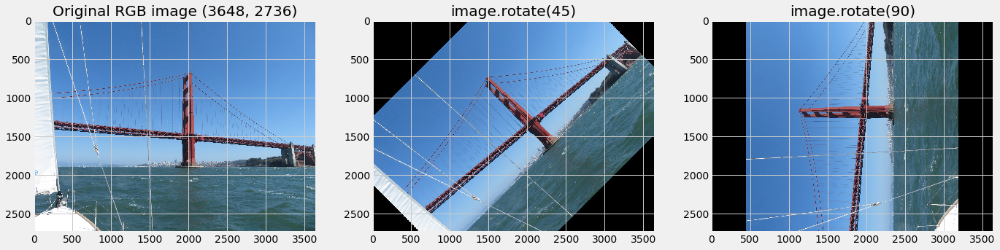

In [49]:
# create rotated versions of an image
from PIL import Image
from matplotlib import pyplot
# load image
image = Image.open(img_name)

# plot all images using the matplotlib oop interface
fig, axs = plt.subplots(1, 3, figsize=(21, 7)) 
axs[0].imshow(image)
axs[1].imshow(image.rotate(45))
axs[2].imshow(image.rotate(90))
axs[0].set(title=f'Original RGB image {image.size}')
axs[1].set(title=f'image.rotate(45)')
axs[2].set(title=f'image.rotate(90)')


#### Cropped Image
An image can be cropped: that is, a piece can be cut out to create a new image, using the crop()
function. The crop function takes a tuple argument that defines the two x and y coordinates of
the box to crop out of the image.

Running the example creates a cropped square image of 201 pixels starting at 0,0 and
extending down and left to 200,200.

[Text(0.5, 1.0, 'crop the top left corner(0, 0, 500, 500)')]

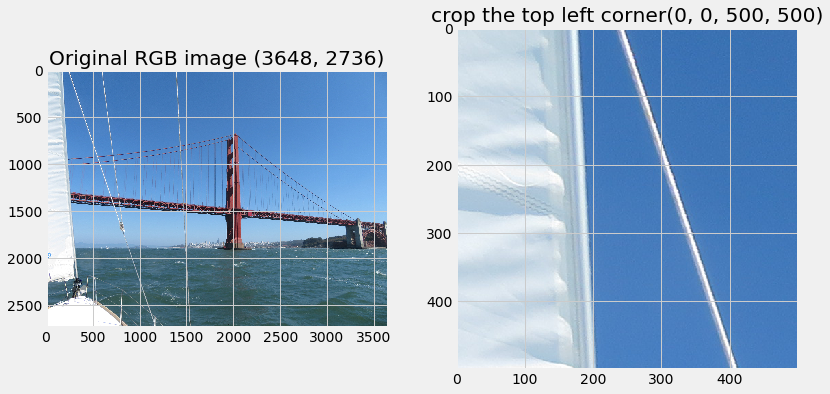

In [131]:
# example of cropping an image
from PIL import Image
# load image
image = Image.open(img_name)


# plot all images using the matplotlib oop interface
fig, axs = plt.subplots(1, 2, figsize=(12, 8)) 
axs[0].imshow(image)
axs[1].imshow(image.crop((0, 0, 500, 500)))
axs[0].set(title=f'Original RGB image {image.size}')
axs[1].set(title=f'top left corner crop of original(0, 0, 500, 500)')


## Traditional Image Processing operations

[Text(0.5, 1.0, 'image.filter(ImageFilter.FIND_EDGES)')]

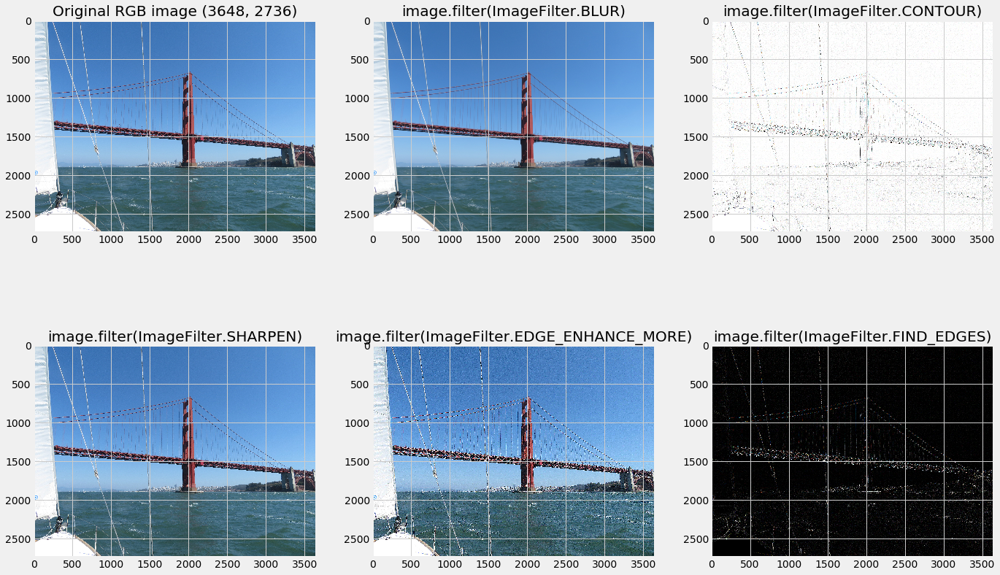

In [145]:
import matplotlib.pyplot as plt
from PIL import Image
from PIL import ImageFilter
image = Image.open(img_name)
# plot all images using the matplotlib oop interface
fig, axs = plt.subplots(2, 3, figsize=(21, 14)) 
axs[0, 0].imshow(image)
axs[0, 1].imshow(image.filter(ImageFilter.BLUR))
axs[0, 2].imshow(image.filter(ImageFilter.CONTOUR), cmap='gray')
axs[0, 0].set(title=f'Original RGB image {image.size}')
axs[0, 1].set(title=f'image.filter(ImageFilter.BLUR)')
axs[0, 2].set(title=f'image.filter(ImageFilter.CONTOUR)')

axs[1, 0].imshow(image.filter(ImageFilter.SHARPEN))
axs[1, 1].imshow(image.filter(ImageFilter.EDGE_ENHANCE_MORE))
axs[1, 2].imshow(image.filter(ImageFilter.FIND_EDGES), cmap='gray')
axs[1, 0].set(title=f'image.filter(ImageFilter.SHARPEN)')
axs[1, 1].set(title=f'image.filter(ImageFilter.EDGE_ENHANCE_MORE)')
axs[1, 2].set(title=f'image.filter(ImageFilter.FIND_EDGES)')


## PIAT: Cutting, pasting, and merging images
The Image class contains methods allowing you to manipulate regions within an image. To extract a sub-rectangle from an image, use the `crop()` method.

```
#Copying a subrectangle from an image
box = (100, 100, 400, 400)
region = im.crop(box)
```
The region is defined by a 4-tuple, where coordinates are (left, upper, right, lower). The Python Imaging Library uses a coordinate system with (0, 0) in the upper left corner. Also note that coordinates refer to positions between the pixels, so the region in the above example is exactly 300x300 pixels.

The region could now be processed in a certain manner and pasted back.

```
#Processing a subrectangle, and pasting it back
region = region.transpose(Image.ROTATE_180)
im.paste(region, box)
```

### Python PIL | ImageDraw.Draw.rectangle()
PIL is the Python Imaging Library which provides the python interpreter with image editing capabilities. The ImageDraw module provide simple 2D graphics for Image objects. You can use this module to create new images, annotate or retouch existing images, and to generate graphics on the fly for web use.

#### ImageDraw.Draw.rectangle() 
Draws an rectangle.

**Syntax: PIL.ImageDraw.Draw.rectangle(xy, fill=None, outline=None)**
**Parameters:**

```python

xy – Four points to define the bounding box. Sequence of either [(x0, y0), (x1, y1)] or [x0, y0, x1, y1]. The second point is just outside the drawn rectangle.
outline – Color to use for the outline.
fill – Color to use for the fill.

Returns: An Image object in rectangle shape.
   
```


### ImageDraw.Draw.text() 
Draws the string at the given position.

**Syntax:
ImageDraw.Draw.text(xy, text, fill=None, font=None, anchor=None, spacing=0, align=”left”)**

**Parameters:**
```python
xy – Top left corner of the text.
text – Text to be drawn. If it contains any newline characters, the text is passed on to multiline_text()
fill – Color to use for the text.
font – An ImageFont instance.
spacing – If the text is passed on to multiline_text(), the number of pixels between lines.
align – If the text is passed on to multiline_text(), “left”, “center” or “right”.

Return Type:
returns an image with text.
```


[Text(0.5, 1.0, 'image plus rotated swatch')]

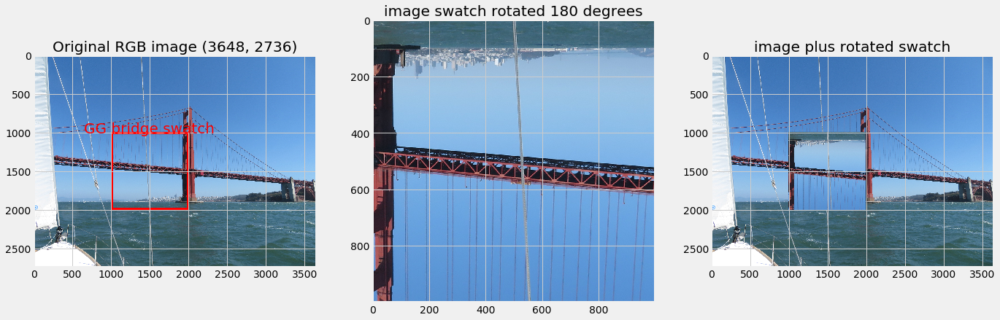

In [3]:
import matplotlib as mpl
from matplotlib import image
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import numpy as np
from PIL import Image, ImageDraw, ImageFont


img_name = 'SF_golden_gate_bridge_3648x2736.jpg'

def flatten(list_of_lists):
    """Flatten as list of list 
       
       flatten([[1,2], [3, 4]])  
       RETURNS:  [1, 2, 3, 4]  """
    return [val for sublist in list_of_lists for val in sublist]
#flatten([[1,2], [3, 4]]) #[1, 2, 3, 4]

# load image
image = Image.open(img_name)
#get an image swatch by specifying subrectangle
w = h = 2000
swatch_coords = [(h-1000, w-1000), (w, h)] 
image_swatch = image.crop(flatten(swatch_coords))
#Process the swatch and paste it back to the original image
image2 = image.copy()
image_swatch = image_swatch.transpose(Image.ROTATE_180)
image2.paste(image_swatch, flatten(swatch_coords))


# mark out the swatch in the original image
# get a font
draw_image_ctx = ImageDraw.Draw(image) ## create drawing context
draw_image_ctx.rectangle(swatch_coords,  outline="red", width=25)
# use ax.text() instead to draw text
#draw_image_ctx.text([swatch_coords[0][0]-200, swatch_coords[0][1]], "image swatch",   fill='#FFFFFF', align ="left")

# plot all images using the matplotlib oop interface
fig, axs = plt.subplots(1, 3, figsize=(21, 7)) 
axs[0].imshow(image)
axs[1].imshow(image_swatch)
axs[2].imshow(image2)
axs[0].set(title=f'Original RGB image {image.size}')
style = dict(size=20, color='red')
axs[0].text(swatch_coords[0][0]-350, swatch_coords[0][1], "GG bridge swatch", **style)

axs[1].set(title=f'image swatch rotated 180 degrees')
axs[2].set(title=f'image plus rotated swatch')


# Scaling image data (for, say, ML purposes)

## Normalize image pixels to [0,1] range

Normalization is a good default data preparation (for any modeling problem, image or otherwise) that should be performed as a preprocessing step for most machine learning algorithms (except, say, decision trees). In the case of, say, image classification, it can be performed per image and does not
require the calculation of statistics across the training dataset, as the range of pixel values is typically in the [0, 255] interval. The following code performs a simple [0,1] normalization of pixels.

```python
from numpy import asarray
from PIL import Image
image = Image.open(img_name)
pixels = np.asarray(image)
# convert from integers to floats
pixels = pixels.astype('float32')
# normalize to the range 0-1
pixels /= 255.0
```

In [12]:
img_name = 'SF_golden_gate_bridge_3648x2736.jpg'
# example of pixel normalization
from numpy import asarray
from PIL import Image
# load image
image = Image.open(img_name)
pixels = np.asarray(image)
# confirm pixel range is 0-255
print(f'Data Type: {type(pixels)} {pixels.dtype}')
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))
# convert from integers to floats
pixels = pixels.astype('float32')

# normalize to the range 0-1
pixels /= 255.0
# confirm the normalization
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))


Data Type: <class 'numpy.ndarray'> uint8
Min: 0.000, Max: 255.000
Min: 0.000, Max: 1.000


## Center Pixel Values: {images} X {channels} --> [0, 1]

A popular data preparation technique for image data is to subtract the mean value from the
pixel values. This approach is called centering, as the distribution of the pixel values is centered
on the value of zero. 

Centering pixel values can be accomplished by a number of ways:

 * {per img, per minibatch, per training set} X {across all channel, per channel}

Centering can be performed before or after normalization. Centering the
pixels then normalizing will mean that the pixel values will be centered close to 0.5 and be in
the range 0-1. Centering after normalization will mean that the pixels will have positive and
negative values, in which case images will not display correctly (e.g. pixels are expected to have
value in the range 0-255 or 0-1). Centering after normalization might be preferred, although it
might be worth testing both approaches.
Centering requires that a mean pixel value be calculated prior to subtracting it from the
pixel values. There are multiple ways that the mean can be calculated; for example:

* Per image.
* Per minibatch of images (under stochastic gradient descent).
* Per training dataset.

The mean can be calculated for all pixels in the image, referred to as a *global centering*, or
it can be calculated for each channel in the case of color images, referred to as *local centering*.
* **Global Centering** : Calculating and subtracting the mean pixel value across color
channels.
* **Local Centering**: Calculating and subtracting the mean pixel value per color channel.

### Global Centering using Numpy

```python
# calculate global mean
mean = pixels.mean()
print('Mean: %.3f' % mean)
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))
# global centering of pixels
pixels = pixels - mean
# confirm it had the desired effect
mean = pixels.mean()
print('Mean: %.3f' % mean)
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))
```

Mean: 137.813
Min: 0.000, Max: 255.000
Globally Centered Mean: -0.000
Globally New Min: -137.813, Globally New Max: 117.187


[Text(0.5, 1.0, 'globally centered image BUT use array_to_img() \nto put the image back in the [0, 255] range to render it')]

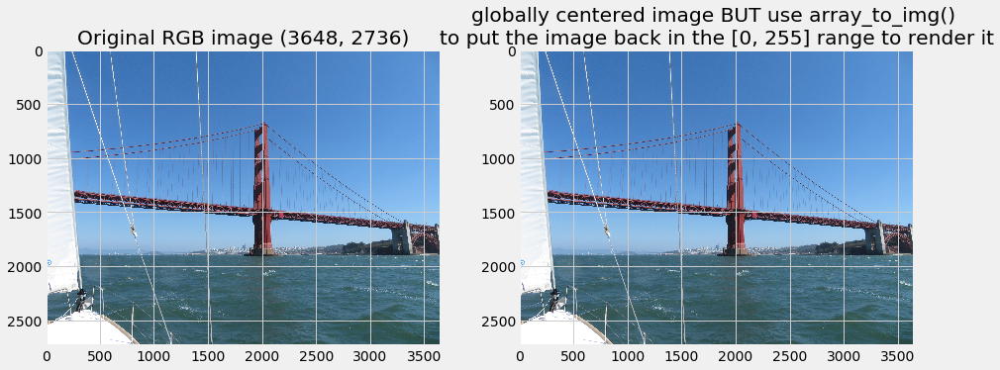

In [146]:
# example of global centering (subtract mean using numpy)
from numpy import asarray
from PIL import Image
from keras.preprocessing.image import img_to_array, array_to_img
# load image
image = Image.open(img_name)

# convert image to numpy
pixels = asarray(image)
# convert from integers to floats
pixels = pixels.astype('float32')
# calculate global mean
mean = pixels.mean()
print('Mean: %.3f' % mean)
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))
# global centering of pixels
pixels = pixels - mean
# confirm it had the desired effect
mean = pixels.mean()
print('Globally Centered Mean: %.3f' % mean)
print('Globally New Min: %.3f, Globally New Max: %.3f' % (pixels.min(), pixels.max()))

# create Pillow image; basically put the image back in the [0, 255] range to render it
global_centered = array_to_img(pixels)

# plot all images using the matplotlib oop interface
fig, axs = plt.subplots(1, 2, figsize=(14, 7)) 
axs[0].imshow(image)
axs[1].imshow(global_centered)
axs[0].set(title=f'Original RGB image {image.size}')
# style = dict(size=20, color='red')
# axs[0].text(swatch_coords[0][0]-350, swatch_coords[0][1], "GG bridge swatch", **style)
axs[1].set(title=f'globally centered image BUT use array_to_img() \nto put the image back in the [0, 255] range to render it')


####  per-channel centering (subtract mean) using numpy axis

In [26]:
## Calculate channel means
import numpy as np
# 3D array  
arr =  np.arange(5*4*3).reshape(5,4,3) 
print(arr)
# mean of the flattened array  
print("\nmean of arr, axis = None : ", np.mean(arr))  
    
# mean along the axis = 0  
print("\nmean of arr, axis = 0 : ", np.mean(arr, axis = 0))  
   
# mean along the axis = 1  
print("\nmean of arr, axis = 1 : ", np.mean(arr, axis = 1)) 
# mean along the axis = 2  
print("\nmean of arr, axis = 2 : ", np.mean(arr, axis = 2)) 
 

[[[ 0  1  2]
  [ 3  4  5]
  [ 6  7  8]
  [ 9 10 11]]

 [[12 13 14]
  [15 16 17]
  [18 19 20]
  [21 22 23]]

 [[24 25 26]
  [27 28 29]
  [30 31 32]
  [33 34 35]]

 [[36 37 38]
  [39 40 41]
  [42 43 44]
  [45 46 47]]

 [[48 49 50]
  [51 52 53]
  [54 55 56]
  [57 58 59]]]

mean of arr, axis = None :  29.5

mean of arr, axis = 0 :  [[24. 25. 26.]
 [27. 28. 29.]
 [30. 31. 32.]
 [33. 34. 35.]]

mean of arr, axis = 1 :  [[ 4.5  5.5  6.5]
 [16.5 17.5 18.5]
 [28.5 29.5 30.5]
 [40.5 41.5 42.5]
 [52.5 53.5 54.5]]

mean of arr, axis = 2 :  [[ 1.  4.  7. 10.]
 [13. 16. 19. 22.]
 [25. 28. 31. 34.]
 [37. 40. 43. 46.]
 [49. 52. 55. 58.]]


image shape: (2736, 3648, 3)
Means: [ 98.18532134 138.26777861 176.98540346]
Mins: [0. 0. 0.], Maxs: [255. 255. 255.]
Means: [ 4.62769417e-10 -2.42401489e-07 -8.30302143e-07]
Mins: [ -98.18532 -138.26778 -176.9854 ], Maxs: [156.81468  116.73222   78.014595]


[Text(0.5, 1.0, 'per channel centered image\nnotice the distorted colors')]

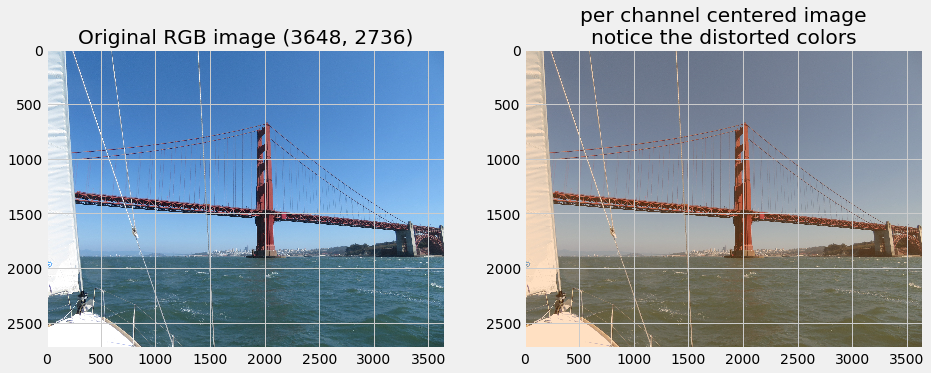

In [147]:
# example of per-channel centering (subtract mean)
from numpy import asarray
from PIL import Image
# load image
image = Image.open(img_name)

pixels = asarray(image)
# convert from integers to floats
pixels = pixels.astype('float32')
print(f"image shape: {pixels.shape}")
# calculate per-channel means and standard deviations
means = pixels.mean(axis=(0,1), dtype='float64')
print('Means: %s' % means)
print('Mins: %s, Maxs: %s' % (pixels.min(axis=(0,1)), pixels.max(axis=(0,1))))
# per-channel centering of pixels
pixels -= means
# confirm it had the desired effect
means = pixels.mean(axis=(0,1), dtype='float64')
print('Means: %s' % means)
print('Mins: %s, Maxs: %s' % (pixels.min(axis=(0,1)), pixels.max(axis=(0,1))))

# create Pillow image; basically put the image back in the [0, 255] range to render it
global_centered = array_to_img(pixels)

# plot all images using the matplotlib oop interface
fig, axs = plt.subplots(1, 2, figsize=(14, 7)) 
axs[0].imshow(image)
axs[1].imshow(global_centered)
axs[0].set(title=f'Original RGB image {image.size}')
# style = dict(size=20, color='red')
# axs[0].text(swatch_coords[0][0]-350, swatch_coords[0][1], "GG bridge swatch", **style)
axs[1].set(title=f'per channel centered image\nnotice the distorted colors')



#### global pixel standardization via numpy

Scalar Mean: 137.813, Standard Deviation: 60.002
Standardized image Mean: -0.000, Standard Deviation: 1.000
Transformed Mean: 137.481, Standard Deviation: 60.017


[Text(0.5, 1.0, 'Global standarization via a scalar global mean, std')]

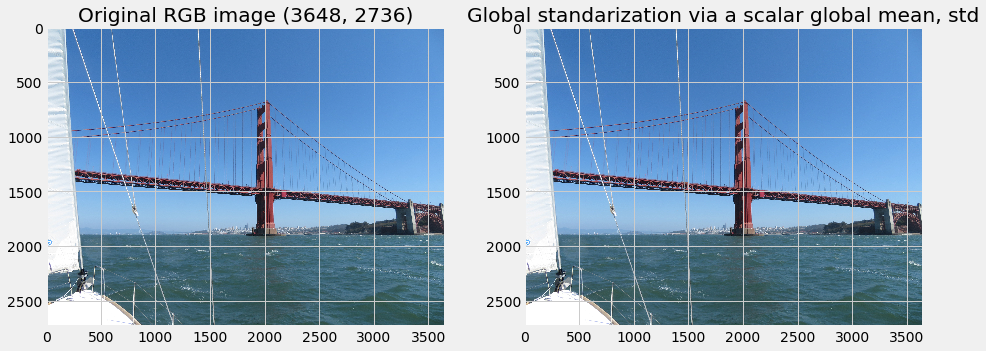

In [28]:
# example of global pixel standardization
from numpy import asarray
from PIL import Image
# load image
image = Image.open(img_name)
pixels = asarray(image)
# convert from integers to floats
pixels = pixels.astype('float32')
# calculate global mean and standard deviation
mean, std = pixels.mean(), pixels.std()
print('Scalar Mean: %.3f, Standard Deviation: %.3f' % (mean, std))
# global standardization of pixels
pixels = (pixels - mean) / std
# confirm it had the desired effect
mean, std = pixels.mean(), pixels.std()
print('Standardized image Mean: %.3f, Standard Deviation: %.3f' % (mean, std))

# create Pillow image; basically put the image back in the [0, 255] range to render it
global_centered = array_to_img(pixels)
# summarize image details
mean, std = asarray(global_centered).mean(), asarray(global_centered).std()
print('Transformed Mean: %.3f, Standard Deviation: %.3f' % (mean, std))

# plot all images using the matplotlib oop interface
fig, axs = plt.subplots(1, 2, figsize=(14, 7)) 
axs[0].imshow(image)
axs[1].imshow(global_centered)
axs[0].set(title=f'Original RGB image {image.size}')
# style = dict(size=20, color='red')
# axs[0].text(swatch_coords[0][0]-350, swatch_coords[0][1], "GG bridge swatch", **style)
axs[1].set(title=f'Global standarization via a scalar global mean, std')



### Positive Global Standardization; clip to range [-1, 1] and rescale to [0, 1]
Image-based  applications typically work with positive pixel data. This helps when it comes to visualizing images. As result it is desireable to keep pixel values positive (even after normalization). A
popular way of achieving a positive normalization can be accomplished as follows:
* the standardized pixel values to the range [-n, n], where n represents the number of standard deviations. Typical values here could could be 1 or 2.  
* rescale the values from [-n,n] to [0,1]. The following example demonstrates this positive standardisation. 

In [33]:
# example of global pixel standardization shifted to positive domain
from numpy import asarray
from numpy import clip
from PIL import Image
# load image
image = Image.open(img_name)
pixels = asarray(image)
# convert from integers to floats
pixels = pixels.astype('float32')
# calculate global mean and standard deviation
mean, std = pixels.mean(), pixels.std()
print(f'global Mean: {mean:.3}, global Standard Deviation: {std:.3}')
# global standardization of pixels
pixels = (pixels - mean) / std
# clip pixel values to [-1,1]
pixels = clip(pixels, -1.0, 1.0)
# shift from [-1,1] to [0,1] with 0.5 mean
pixels = (pixels + 1.0) / 2.0
# confirm it had the desired effect
mean, std = pixels.mean(), pixels.std()
print(f'After positive standardization global pixel mean, standard deviation are {pixels.mean():.2}, {pixels.std():.2}')
print(f'After positive standardization global pixel min and max are {pixels.min()}, {pixels.max()}')


global Mean: 1.38e+02, global Standard Deviation: 60.0
After positive standardization global pixel mean, standard deviation are 0.48, 0.39
After positive standardization global pixel min and max are 0.0, 1.0


# How to Load and Manipulate Images (i.e., Numpy arrays) with Keras
The Keras deep learning library provides a sophisticated API for loading, preparing, and
augmenting image data.
The Keras deep learning library provides utilities for working with image data. The main API
is the ImageDataGenerator class that combines data loading, preparation, and augmentation. This will not be discussed in this section; it will be covered in the next section.

## Keras `load_img()` as PIL image
Keras provides the `load img()` function for loading an image from file as a **PIL** image object.

<class 'PIL.MpoImagePlugin.MpoImageFile'>
MPO
RGB
(3648, 2736)
['_Image__transformer', '_MpoImageFile__fp', '_MpoImageFile__frame', '_MpoImageFile__framecount', '_MpoImageFile__mpoffsets', '__array_interface__', '__class__', '__copy__', '__delattr__', '__dict__', '__dir__', '__doc__', '__enter__', '__eq__', '__exit__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_after_jpeg_open', '_close__fp', '_close_exclusive_fp_after_loading', '_copy', '_crop', '_dump', '_ensure_mutable', '_exclusive_fp', '_exif', '_expand', '_get_safe_box', '_getexif', '_getmp', '_min_frame', '_new', '_open', '_repr_png_', '_seek_check', '_size', 'adopt', 'alpha_composite', 'app', 'applist', 'bits', 'category', 'close', 'convert', 'copy', 'crop', 'custom_mim

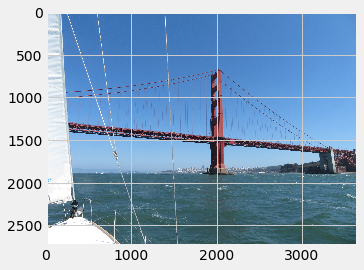

In [46]:
# example of loading an image with the Keras API
from keras.preprocessing.image import load_img
# load the image
img = load_img(img_name)
# report details about the image
print(type(img))
print(img.format)
print(img.mode)
print(img.size)
print(dir(img))
# show the image
#img.show()
plt.imshow(img)
plt.title('image loaded via Keras in PIL format')


## How to Convert an Image With Keras
Keras provides the img to array() function for converting a loaded image in PIL format into
a NumPy array for use with deep learning models. The API also provides the array to img()
function that can be used for converting a NumPy array of pixel data into a PIL image. This
can be useful if the pixel data is modified in array format because it can be saved or viewed.

In [56]:
# example of converting an image with the Keras API
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import array_to_img
# load the image
img = load_img(img_name)
print(type(img))
# img_to_array(img):  Convert a PIL Image instance to a Numpy array
img_array = img_to_array(img)
print(f"after Convert a PIL Image instance to a Numpy array the array type is {type(img_array)}")
print(f"The pixel type is {img_array.dtype}")
print(img_array.shape)
# convert a numpy array back to PIL image
img_pil = array_to_img(img_array)
print(type(img_pil))


<class 'PIL.MpoImagePlugin.MpoImageFile'>
after Convert a PIL Image instance to a Numpy array the type is float32
after Convert a PIL Image instance to a Numpy array the array type is <class 'numpy.ndarray'>
(2736, 3648, 3)
<class 'PIL.Image.Image'>


## How to Save an  NumPy_array_based Image With Keras
The Keras API also provides the save img() function to save an image to file. The function
takes the path to save the image, and the **image data in NumPy array format**. 

* The file format is inferred from the filename, but can also be specified via the file format argument. 
  * This can
be useful if you have manipulated image pixel data, such as scaling, and wish to save the image
for later use. 

The example below loads the photograph image in grayscale format, converts it to
a NumPy array, and saves it to a new file name.

In [73]:
# example of saving an image with the Keras API
from keras.preprocessing.image import load_img
from keras.preprocessing.image import save_img
from keras.preprocessing.image import img_to_array
# load image as as grayscale
img = load_img(IMAGE, color_mode='grayscale')
# convert image to a numpy array
img_array = img_to_array(img)
# save the image with a new filename
save_img('img.jpg', img_array)
# load the image to confirm it was saved correctly
img = load_img('img.jpg')
print(type(img))
print(img.format)
print(img.mode)
print(img.size)
img.show()


<class 'PIL.Image.Image'>
None
RGB
(640, 360)


# A simple CNN for classifying photos of cats and dogs

The following example is based on from the Keras Blog located [here](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), Building powerful image classification models using very little data
by Francois Chollet.

It uses data that can be downloaded at:
https://www.kaggle.com/c/dogs-vs-cats/data


To get everything setup, we:
- create a data/ folder
- create train/ and validation/ subfolders inside data/
- created cats/ and dogs/ subfolders inside train/ and validation/
- put the cat pictures index 0-999 in data/train/cats
- put the cat pictures index 1000-1400 in data/validation/cats
- put the dogs pictures index 12500-13499 in data/train/dogs
- put the dog pictures index 13500-13900 in data/validation/dogs

So that we have 1000 training examples for each class, and 400 validation examples for each class.
In summary, this is our directory structure:
``` python
data/
    train/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
    validation/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
```

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K


# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = 'data/train'
validation_data_dir = 'data/validation'
nb_train_samples = 2000
nb_validation_samples = 800
epochs = 50
batch_size = 16

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='binary')

model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)

model.save_weights('first_try.h5')

# Training/testing  networks with DISK/MEMORY-based data using Keras' `ImageDataGenerator()`

When modeling  big data problems such as image classification, one can and must use different types of deep learning pipelines or workflows. The most common workflows are made up of a preprocessing steps, training, evaluation, and deployment (the deployment step is not addressed here as this can required additional optimization tradeoffs around memory footprint, model throughput, and other hardware tradeoffs such as CPU/GPU).

For modeling problems in the image domain, the following input data preprocessing steps are typical:

* image normalization where, for example, each pixel intensity level is scaled to the [0, 1] interval 
* right-sizing the input image (required for many network architectures), whereby the spatial dimensions of the input image is shrunk or expanded to fit the expected dimensions of the input layer of the network

In addition, training/validation/testing data is typically made up of two types of data:
* Real example data taken from the field 
* or real data plus artifical data, whereby  a combination of the raw data and artifically generated examples obtained, say, via data augmentation are used to train/validate/test the network

The data preprocessing and data generation steps can be accomplished in a number of different ways with Keras (or other deep learning frameworks.  

## Scenario 1: load all data into memory, normalize the data to [0, 1] interval, do batch learning
If working with the raw data (or a normalized version of the data, say, where each pixel intensity level is scaled to the [0, 1] interval) then one can simply load all the data into memory and fit the network model as usual. For more details, see the following partial example:

```python

(X_train, y_train), (X_test, y_test) = mnist.load_data()

X_train = X_train.reshape(X_train.shape[0], 28, 28, 1)
X_test = X_test.reshape(X_test.shape[0], 28, 28, 1)
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train /= 255  # numpy elementwise divide by 255 to yield [0, 1] rescaling
X_test /= 255
print(X_train.shape)

y_train = np_utils.to_categorical(y_train, 10)
y_test = np_utils.to_categorical(y_test, 10)

model = Sequential()

model.add(Convolution2D(filters=6, 
                        kernel_size=(5, 5), 
                        padding="valid", 
                        input_shape = (28, 28, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
......
model.add(Flatten())
model.add(Dense(84))
model.add(Activation("sigmoid"))
model.add(Dense(10))
model.add(Activation('softmax'))

model.compile(loss="categorical_crossentropy", optimizer="Adam", metrics=["accuracy"])
hist = model.fit(X_train, y_train, 
                 batch_size=32, epochs=20, 
                 validation_data=(X_test, y_test))

```

## Scenario 1: load all data into memory, normalize the data to [0, 1] interval, do batch learning

If, however, the dataset proves to be too big, one can use a hybrid memory and disk-based process to train/validate/test a neural network model using the `ImageDataGenerator()` Keras class. With `ImageDataGenerator()` data is loaded into memory in batch form during fitting thereby allieviating the lack of memory for huge datasets. Note that `ImageDataGenerator()` is a more general purpose function for preparing and processing  batches of tensor image data in that it also supports functionality, such as,  real-time data augmentation (described below). 


The `ImageDataGenerator()` function also allows you to specify the type of classification task via the class mode
argument, specifically whether it is `‘binary’` or a multiclass classification `‘categorical’`. The
default batch size is 32, which means that 32 randomly selected images from across the classes
in the dataset will be returned in each batch when training. You may also want to return batches in a deterministic order when evaluating a model,
which you can do by setting `shuffle` to `False`. The subdirectories of images, one for each
class, are loaded by the flow from directory() function in alphabetical order and assigned
an integer for each class. For example, the subdirectory blue comes before red alphabetically,
therefore the class labels are assigned the integers: blue=0, red=1. This can be changed via
the classes argument in calling flow from `directory()` when training the model.


```python
...
# load and iterate training dataset
train_it = datagen.flow_from_directory('data/train/', class_mode='binary', batch_size=64)
# load and iterate validation dataset
val_it = datagen.flow_from_directory('data/validation/', class_mode='binary', batch_size=64)
# load and iterate test dataset
test_it = datagen.flow_from_directory('data/test/', class_mode='binary', batch_size=64)
```

Once the iterators have been prepared, we can use them when fitting and evaluating a deep
learning model. For example, fitting a model with a data generator can be achieved by calling
the fit generator() function on the model and passing the training iterator (train it). The
validation iterator (val it) can be specified when calling this function via the validation data
argument. The steps per epoch argument must be specified for the training iterator in order
to define how many **batches of images defines a single epoch**.
For example, if you have 1,000 images in the training dataset (across all classes) and a batch
size of 64, then the steps per epoch would be about 16, or $\frac{1000}{64}$ . Similarly, if a validation
iterator is applied, then the validation steps argument must also be specified to indicate the
number of batches in the validation dataset defining one epoch.

```python
...
# define model
model = ...
# fit model
model.fit_generator(train_it, steps_per_epoch=16, validation_data=val_it,
validation_steps=8)
```

Finally, if you want to use your fit model for making predictions on a very large dataset, you
can create an iterator for that dataset as well (e.g. `test_it`) and call the predict generator()
function on the model.
```python
...
# make a prediction
yhat = model.predict_generator(test_it, steps=24)
```


## `ImageDataGenerator()`: JIT Scaling of  Image Pixel Data with Keras

flow_from_dataframe method

The pixel values in images must be scaled prior to providing the images as input to a deep
learning neural network model during the training or evaluation of the model. Traditionally, the
images would have to be scaled prior to the development of the model and stored in **memory** or
on disk in the scaled format. An alternative approach is to scale the images using a preferred
scaling technique just-in-time during the training or model evaluation process (thereby avoiding huge memory requirements that typically arise for image datasets). Keras supports
this type of load from-disk, just-in-time, data preparation for image data via the `ImageDataGenerator` class and API. Note that `ImageDataGenerator` is a more general purpose function for preparing and processing  batches of tensor image data supporting functionality, such as,  real-time data augmentation also. 

In this section we're going to use the MNIST dataset with handwritten digits, digits 0-9.

## load MNIST and verify it is  big 3 numpy array with indexes: image x height x width


In [84]:
# load MNIST data
from keras.datasets import mnist
from sklearn.model_selection import train_test_split
(X_train, y_train), (X_test, y_test) = mnist.load_data()
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.20, random_state=42)
img_rows, img_cols = 28, 28
number_of_classes = 10
print(f"X before flatten train      shape: {X_train.shape}")
print(f"X before flatten validation shape: {X_valid.shape}")
print(f"X before flatten test       shape: {X_test.shape}")

11493376/11490434 [==============================] - 2s 0us/step
X before flatten train      shape: (48000, 28, 28)
X before flatten validation shape: (12000, 28, 28)
X before flatten test       shape: (10000, 28, 28)


In [85]:
X_train.shape

(48000, 28, 28)

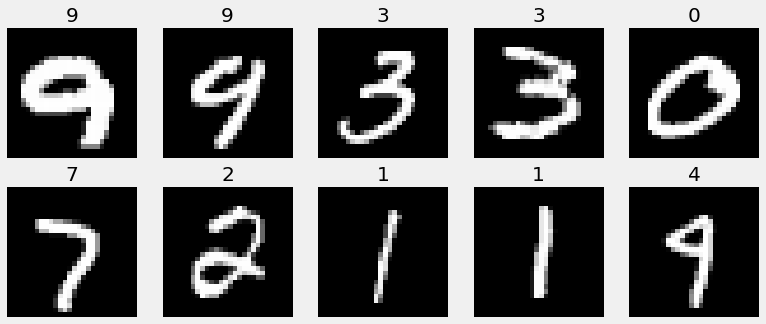

In [86]:
plt.figure(figsize=(12, 5))
for num, i in enumerate(np.random.choice(len(X_train), 10)):
    plt.subplot(2, 5, num + 1)
    plt.imshow(X_train[i], cmap="Greys_r")
    plt.axis("off")
    plt.title(str(y_train[i]))

type(X_train[0, :120, :20]): <class 'numpy.ndarray'>


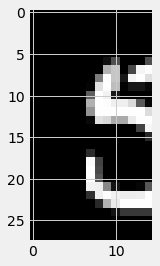

In [95]:
## MNIST is stored a big 3 numpy array with indexes: image x height x width
print(f"type(X_train[0, :120, :20]): {type(X_train[0, :120, :20])}")
plt.imshow(X_train[0, :28, :15], cmap="Greys_r")

In [85]:
# summarize pixel values
print("    MIN MAX          MEAN        STD")
print('Train', X_train.min(), X_train.max(), X_train.mean(), X_train.std())
print('Valid', X_valid.min(), X_valid.max(), X_valid.mean(), X_valid.std())
print('Test ', X_test.min(), X_test.max(), X_test.mean(), X_test.std())


    MIN MAX          MEAN        STD
Train 0 255 33.340038876488094 78.59439408739591
Valid 0 255 33.23195174319728 78.45972175157397
Test  0 255 33.791224489795916 79.17246322228644


##  ImageDataGenerator pixel scaling techniques
Three of the main types of pixel scaling techniques supported by the ImageDataGenerator class are as
follows:
* Pixel Normalization: scale pixel values to the range 0-1.
* Pixel Centering: scale pixel values to have a zero mean.
* Pixel Standardization: scale pixel values to have a zero mean and unit variance

If the chosen scaling method requires that statistics be calculated across the training
dataset, then these statistics can be calculated and stored by calling the `fit()` function. When
evaluating and selecting a model, it is common to calculate these statistics on the training
dataset and then apply them to the validation and test datasets.

```python
# create data generator
datagen = ImageDataGenerator()
# calculate scaling statistics on the training dataset
datagen.fit(trainX)
```

### flow() iterator for training a NN
Once prepared, the data generator can be used to fit a neural network model by calling the
**`flow()`** function to retrieve an iterator that returns batches of samples and passing it to the
fit `generator()` function.

```python
# get batch iterator
train_iterator = datagen.flow(trainX, trainy)
# fit model
model.fit_generator(train_iterator, ...)
```

If a validation dataset is required, a separate batch iterator can be created from the same
data generator that will perform the same pixel scaling operations and use any required statistics
calculated on the training dataset.

```python
...
# get batch iterator for training
train_iterator = datagen.flow(trainX, trainy)
# get batch iterator for validation
val_iterator = datagen.flow(valX, valy)
# fit model
model.fit_generator(train_iterator, validation_data=val_iterator, ...)
```

### `evaluate_generator()` provides test set batch iterator
Once fit, the model can be evaluated by creating a batch iterator for the test dataset
and calling the `evaluate_generator()` function on the model. Again, the same pixel scaling
operations will be performed and any statistics calculated on the training dataset will be used,
if needed.
```python
...
# get batch iterator for testing
test_iterator = datagen.flow(testX, testy)
# evaluate model loss on test dataset
loss = model.evaluate_generator(test_iterator, ...)
```

###  Toy example with ImageDataGenerator example for pixel scaling to [0, 1] scale
The section presents a toy example with ImageDataGenerator example for pixel scaling to [0, 1] scale. The ImageDataGenerator does not need to be fit in this case because there are no global
statistics, like mean and standard deviation, that need to be calculated. Next, iterators can be
created using the generator for both the train and test datasets. We will use a batch size of 64. This means that each of the train and test datasets of images are divided into groups of 64
images that will then be scaled when returned from the iterator. We can see how many batches
there will be in one epoch, e.g. one pass through the training dataset, by printing the length of
each iterator.

In [98]:
# example of normalizing a image dataset
from keras.datasets import mnist
from keras.preprocessing.image import ImageDataGenerator
# load dataset
(trainX, trainY), (testX, testY) = mnist.load_data()

print(f"type of a single training  example {type(trainX[0])}")
print(f"shape of a single training example {trainX[0].shape}")
print(f"number of training examples {trainX.shape[0]}")
# reshape dataset to have a single channel
width, height, channels = trainX.shape[1], trainX.shape[2], 1
trainX = trainX.reshape((trainX.shape[0], width, height, channels))
testX = testX.reshape((testX.shape[0], width, height, channels))
# confirm scale of pixels
print('scale of pixels: Train min=%.3f, max=%.3f' % (trainX.min(), trainX.max()))
print('scale of pixels: Test min=%.3f, max=%.3f' % (testX.min(), testX.max()))

# create generator (1.0/255.0 = 0.003921568627451)
datagen = ImageDataGenerator(rescale=1.0/255.0)
# Note: there is no need to fit the generator in this case
# prepare a iterators to scale images
train_iterator = datagen.flow(trainX, trainY, batch_size=64)
test_iterator = datagen.flow(testX, testY, batch_size=64)
print("------------------------------------------------")
print("generator that batches ")
print('Number Batches for train=%d, test=%d' % (len(train_iterator), len(test_iterator)))
print(f"len(train_iterator) * 64 #the batch size {len(train_iterator)*64}")
# confirm the scaling works
batchX, batchy = train_iterator.next()
print('Batch shape=%s, min=%.3f, max=%.3f' % (batchX.shape, batchX.min(), batchX.max()))



type of a single training  example <class 'numpy.ndarray'>
shape of a single training example (28, 28)
number of training examples 60000
scale of pixels: Train min=0.000, max=255.000
scale of pixels: Test min=0.000, max=255.000
------------------------------------------------
Number Batches for train=938, test=157
len(train_iterator) * 64 #the batch size 60032
Batch shape=(64, 28, 28, 1), min=0.000, max=1.000


The ImageDataGenerator for [0, 1] normalization does not need to be fit on the training dataset as there is nothing
that needs to be calculated;  we have provided the scale factor directly. A single batch of
normalized images is retrieved and we can confirm that the min and max pixel values are zero
and one respectively.

## How to Center Images With `ImageDataGenerator(featurewise_center=True)`
Another popular pixel scaling method is to calculate the mean pixel value across the entire
training dataset, then subtract it from each image. This achieves the same result as the following in numpy in the case of centering the training data:

```python
trainX -= trainX.mean()  #gray scale images
```
. This is called centering and has the effect
of centering the distribution of pixel values on zero: that is, the mean pixel value for centered
images will be zero. The `ImageDataGenerator` class refers to centering that uses the mean
calculated on the training dataset as `feature-wise` centering. It requires that the statistic is
calculated on the training dataset prior to scaling.

```python
...
# create generator that centers pixel values
# STEP 1: create
datagen = ImageDataGenerator(featurewise_center=True)

# calculate the mean on the training dataset
# Step 2: FIT 
datagen.fit(trainX)
print('Data Generator Mean (for training set only naturally): %.3f' % datagen.mean)
```

Once the statistic is calculated
on the training dataset, we can confirm the value by accessing and printing it; for example:

```python
# print the mean calculated on the training dataset.
print(datagen.mean)
```


### Example: Center Images With ImageDataGenerator

We can also confirm that the scaling procedure has had the desired effect by calculating the
mean of a batch of images returned from the batch iterator. We would expect the mean to be a
small value close to zero, but not zero because of the small number of images in the batch. For a sample batch for a batch of 64 images the batchX.mean is 1.19677, whicle the it is  -1.9512 for all images

```python
Means train=33.318, test=33.791
Data Generator Mean (for training set only naturally): 33.318
batchX.shape: (64, 28, 28, 1),    batchX.mean 1.1967780590057373
batchX.shape: (60000, 28, 28, 1), batchX.mean -1.9512917788233608e-05
    ```

In [96]:
# example of centering a image dataset
from keras.datasets import mnist
from keras.preprocessing.image import ImageDataGenerator
# load dataset
(trainX, trainy), (testX, testy) = mnist.load_data()
# reshape dataset to have a single channel
width, height, channels = trainX.shape[1], trainX.shape[2], 1
trainX = trainX.reshape((trainX.shape[0], width, height, channels))
testX = testX.reshape((testX.shape[0], width, height, channels))
# report per-image mean
print('Means train=%.3f, test=%.3f' % (trainX.mean(), testX.mean()))
# create generator that centers pixel values
# STEP 1: create
datagen = ImageDataGenerator(featurewise_center=True)

# calculate the mean on the training dataset
# Step 2: FIT 
datagen.fit(trainX)
print('Data Generator Mean (for training set only naturally): %.3f' % datagen.mean)

# demonstrate effect on a single batch of samples
# Step 3: APPLY mean to batch
iterator = datagen.flow(trainX, trainy, batch_size=64)
# get a batch
batchX, batchy = iterator.next()
# mean pixel value in the batch
print(f"batchX.shape: {batchX.shape},    batchX.mean {batchX.mean()}")

# VERIFY  effect on entire training dataset by setting the BATCHSIZE to the size of the training data
iterator = datagen.flow(trainX, trainy, batch_size=len(trainX), shuffle=False)
# get a batch
batchX, batchy = iterator.next()
# mean pixel value in the batch
print(f"batchX.shape: {batchX.shape}, batchX.mean {batchX.mean()}")


Means train=33.318, test=33.791
Data Generator Mean (for training set only naturally): 33.318
batchX.shape: (64, 28, 28, 1),    batchX.mean 0.9853625893592834
batchX.shape: (60000, 28, 28, 1), batchX.mean -1.9512917788233608e-05


##  Standardize Images With ImageDataGenerator (after centering)
Standardization is a data scaling technique that assumes that the distribution of the data is
Gaussian and shifts the distribution of the data to have a mean of zero and a standard deviation
of one. Data with this distribution is referred to as a standard Gaussian.

It can be beneficial
when training neural networks as the dataset sums to zero and the inputs are small values in
the rough range of about -3.0 to 3.0 (e.g. 99.7 of the values will fall within three standard
deviations of the mean). Standardization of images is achieved by subtracting the mean pixel
value and dividing the result by the standard deviation of the pixel values. 
### Standardize Images feature-wise 
The mean and
standard deviation statistics can be calculated on the training dataset, and as discussed in the
previous section, Keras refers to this as feature-wise.

```python
...
# feature-wise generator
datagen = ImageDataGenerator(featurewise_center=True, featurewise_std_normalization=True)
# calculate mean and standard deviation on the training dataset
datagen.fit(trainX)
```

#### Example: Standardize using all training data and apply batchwise
The effect will be batches of images with an approximate mean of zero and a standard deviation
of one. As with the previous section, we can confirm this with some simple experiments.

In [103]:
# example of standardizing a image dataset
from keras.datasets import mnist
from keras.preprocessing.image import ImageDataGenerator
# load dataset
(trainX, trainy), (testX, testy) = mnist.load_data()
# reshape dataset to have a single channel
width, height, channels = trainX.shape[1], trainX.shape[2], 1
trainX = trainX.reshape((trainX.shape[0], width, height, channels))
testX = testX.reshape((testX.shape[0], width, height, channels))
# report pixel means and standard deviations
print('Statistics train=%.3f (%.3f), test=%.3f (%.3f)' % (trainX.mean(), trainX.std(), testX.mean(), testX.std()))


# create generator that centers pixel values
datagen = ImageDataGenerator(featurewise_center=True, featurewise_std_normalization=True)
# calculate the mean on the training dataset
datagen.fit(trainX)
print('Data Generator mean=%.3f, std=%.3f' % (datagen.mean, datagen.std))
# demonstrate effect on a single batch of samples
iterator = datagen.flow(trainX, trainy, batch_size=64)
# get a batch
batchX, batchy = iterator.next()
# pixel stats in the batch
print(batchX.shape, batchX.mean(), batchX.std())
# demonstrate effect on entire training dataset
iterator = datagen.flow(trainX, trainy, batch_size=len(trainX), shuffle=False)
# get a batch
batchX, batchy = iterator.next()
# pixel stats in the batch
print(batchX.shape, batchX.mean(), batchX.std())


Statistics train=33.318 (78.567), test=33.791 (79.172)
Data Generator mean=33.318, std=78.567
(64, 28, 28, 1) 0.019282771 1.0204165
(60000, 28, 28, 1) -3.4560264e-07 0.9999998


### ImageDataGenerator(samplewise_center=True, samplewise_std_normalization=True): Standardize Images sample-wise

The statistics can also be calculated then used to standardize each image separately, and
Keras refers to this as sample-wise standardization.

```python
...
# sample-wise standardization
datagen = ImageDataGenerator(samplewise_center=True, samplewise_std_normalization=True)

# calculate mean and standard deviation on the training dataset
datagen.fit(trainX)
```

# Working with Large Datasets: a hybrid disk-memory (Disk Directories)  (.JPG files here)

There is a standard way to lay out your image data for modeling. After you have collected
your images, once can organize them into datasets, such as train, test, and validation, and further refine this organization into subsets by  class for image classification tasks. For example, imagine an image classification problem where we wish to
classify photos of cars based on their color, e.g. red cars, blue cars, etc. 

## Directory structure (no more X_train, X_validation in memory data structures)
The contents of the .zip are extracted to the base directory `/tmp/cats_and_dogs_filtered`, which contains `train` and `validation` subdirectories for the training and validation datasets (see the [Machine Learning Crash Course](https://developers.google.com/machine-learning/crash-course/validation/check-your-intuition) for a refresher on training, validation, and test sets), which in turn each contain `cats` and `dogs` subdirectories. **NOTE: we do NOT load the data into memory** in variables like X_train, X_validation any longer since these datasets can be gigabytes to terrabytes in size. 

Let's define each of these directories.

## Laying out data so that we can JIT during training and testing
First, we have a data/
directory where we will store all of the image data. Next, we will have a data/train/ directory
for the training dataset and a data/test/ for the holdout test dataset. We may also have a
data/validation/ for a validation dataset during training.

```
data/
data/train/
data/test/
data/validation/
```

Under each of the dataset directories, we will have subdirectories, one for each class where
the actual image files will be placed. For example, if we have a binary classification task for
classifying photos of cars as either a red car or a blue car, we would have two classes, red and
blue, and therefore two class directories under each dataset directory. For example:

```python
data/
#-----------
data/train/
data/train/red/
data/train/blue/

#-----------
data/test/
data/test/red/
data/test/blue/

#-----------
data/validation/
data/validation/red/
data/validation/blue/
```

Images of red cars would then be placed in the appropriate class directory.
For example:

```
data/train/red/car01.jpg
data/train/red/car02.jpg
data/train/red/car03.jpg
...
data/train/blue/car01.jpg
data/train/blue/car02.jpg
data/train/blue/car03.jpg
```

Remember, we are not placing the same files under the red/ and blue/ directories; instead,
there are different photos of red cars and blue cars respectively. Also recall that we require
different photos in the train, test, and validation datasets. The filenames used for the actual
images often do not matter as we will load all images with given file extensions. A good naming
convention, if you have the ability to rename files consistently, is to use some name followed by
a number with zero padding, e.g. image0001.jpg if you have thousands of images for a class.

## Download Data (25,000 images;  downsample the image count)

Download and unzip the cats and dogs dataset.  We will use Kaggle’s Dogs vs Cats dataset, which contains 25,000 images of cats and dogs.


In [13]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip
!rm -rf data
!mv kagglecatsanddogs_3367a.zip data


wget: /usr/local/lib/libuuid.so.1: no version information available (required by wget)
--2019-07-15 23:48:28--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip
Resolving download.microsoft.com (download.microsoft.com)... 184.27.36.156, ffff:ffff:e800:48e::e59, ffff:ffff:e800:48f::e59
Connecting to download.microsoft.com (download.microsoft.com)|184.27.36.156|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824894548 (787M) [application/octet-stream]
Saving to: 'kagglecatsanddogs_3367a.zip'

kagglecatsanddogs_3 100%[===================>] 786.68M  12.8MB/s    in 62s     

2019-07-15 23:49:30 (12.6 MB/s) - 'kagglecatsanddogs_3367a.zip' saved [824894548/824894548]



In [127]:
#%%capture stdout_stderr_log_zip
%%capture 
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip


In [ ]:
#print(stdout_stderr_log_zip)

In [38]:
%%capture 
!rm -rf data
!mkdir data
!cp kagglecatsanddogs_3367a.zip data
!unzip data/kagglecatsanddogs_3367a.zip -d data
!find PetImages/train/Cat -size  0 -print0 |xargs -0 rm --
!find PetImages/train/Dog -size  0 -print0 |xargs -0 rm --

In [39]:
!ls data

MSR-LA - 3467.docx  PetImages  kagglecatsanddogs_3367a.zip  readme[1].txt


In [21]:
print(stdout_stderr_log)

ls: cannot access 'data/train/Cat': No such file or directory
0
ls: cannot access 'data/train/Dog': No such file or directory
0



### Split some data for testing and validation.

Having download the data we need to split some data for testing and validation, moving images to the train and test folders. We use the train_test_split() function from scikit-learn to build these two sets of data. Thus, we create a structure with training and testing data, and a directory for each target class. This is the common folder structure to use for training a custom image classifier — with any number of classes — with Keras.

In [41]:
from glob import glob
from sklearn.model_selection import train_test_split

cats = glob('data/PetImages/Cat/*.jpg')
dogs = glob('data/PetImages/Dog/*.jpg')
print(f"Number of cat examples in original dataset: {len(cats)}")
print(f"Number of dog examples in original dataset: {len(dogs)}")
# To reduce computational overhead
# only use 10% of the dataset for training, validation, and testing
cats, _ = train_test_split(cats, test_size=0.9)
dogs, _ = train_test_split(dogs, test_size=0.9)
print(f"Number of cat examples in downsampled dataset: {len(cats)}")
print(f"Number of dog examples in downsampled dataset: {len(dogs)}")
# train, validation, and blind test datasets
#
cats_train, cats_test = train_test_split(cats, test_size=0.15)
cats_train, cats_valid = train_test_split(cats_train, test_size=0.15)
dogs_train, dogs_test = train_test_split(dogs, test_size=0.15)
dogs_train, dogs_valid = train_test_split(dogs_train, test_size=0.15)

nb_train_samples  = len(cats_train) + len(dogs_train)
nb_valid_samples  = len(cats_valid) + len(dogs_valid)

TRAIN_DIR = 'data/train'
VALID_DIR = 'data/valid'
TEST_DIR = 'data/test'

!rm -rf $TRAIN_DIR
!rm -rf $VALID_DIR
!rm -rf $TEST_DIR

!mkdir $TRAIN_DIR
!mkdir $VALID_DIR
!mkdir $TEST_DIR

!mkdir $TRAIN_DIR/Cat
files = ' '.join(cats_train)
!mv -t $TRAIN_DIR/Cat $files

!mkdir $TRAIN_DIR/Dog
files = ' '.join(dogs_train)
!mv -t $TRAIN_DIR/Dog $files

cats_train_glob = glob('data/train/Cat/*.jpg')
dogs_train_glob = glob('data/train/Dog/*.jpg')


!mkdir $VALID_DIR/Cat
files = ' '.join(cats_valid)
!mv -t $VALID_DIR/Cat $files

!mkdir $VALID_DIR/Dog
files = ' '.join(dogs_valid)
!mv -t $VALID_DIR/Dog $files

!mkdir $TEST_DIR/Cat
files = ' '.join(cats_test)
!mv -t $TEST_DIR/Cat $files

!mkdir $TEST_DIR/Dog
files = ' '.join(dogs_test)
!mv -t $TEST_DIR/Dog $files

Number of cat examples in original dataset: 12500
Number of dog examples in original dataset: 12500
Number of cat examples in downsampled dataset: 1250
Number of dog examples in downsampled dataset: 1250


In [42]:
!ls -l data/train

total 0
drwxr-xr-x 904 root root 28928 Jul 16 00:53 Cat
drwxr-xr-x 904 root root 28928 Jul 16 00:53 Dog


In [43]:
%%capture stdout_stderr_log
!ls -l data/train/Cat|wc -l
!ls -l data/train/Dog|wc -l
!ls -l data/valid/Cat|wc -l
!ls -l data/valid/Dog|wc -l
!ls -l data/test/Cat|wc -l
!ls -l data/test/Dog|wc -l

In [44]:
print(stdout_stderr_log)

903
903
161
161
189
189



In [28]:
ls -l data/train/Cat

total 29972
-rw-r--r-- 1 root root  16868 Feb 10  2017 1.jpg
-rw-r--r-- 1 root root  19166 Feb 10  2017 10015.jpg
-rw-r--r-- 1 root root  39335 Feb 10  2017 10018.jpg
-rw-r--r-- 1 root root  72589 Feb 10  2017 10019.jpg
-rw-r--r-- 1 root root  41066 Feb 10  2017 10037.jpg
-rw-r--r-- 1 root root  25527 Feb 10  2017 10040.jpg
-rw-r--r-- 1 root root   7184 Feb 10  2017 10066.jpg
-rw-r--r-- 1 root root  13688 Feb 10  2017 10078.jpg
-rw-r--r-- 1 root root  23122 Feb 10  2017 101.jpg
-rw-r--r-- 1 root root  25384 Feb 10  2017 1011.jpg
-rw-r--r-- 1 root root  49376 Feb 10  2017 10112.jpg
-rw-r--r-- 1 root root  19259 Feb 10  2017 10114.jpg
-rw-r--r-- 1 root root 141215 Feb 10  2017 10117.jpg
-rw-r--r-- 1 root root  31445 Feb 10  2017 10120.jpg
-rw-r--r-- 1 root root  30925 Feb 10  2017 10127.jpg
-rw-r--r-- 1 root root  16030 Feb 10  2017 10152.jpg
-rw-r--r-- 1 root root  10488 Feb 10  2017 10163.jpg
-rw-r--r-- 1 root root  52384 Feb 10  2017 10173.jpg
-rw-r--r-- 1 root root  23648 Feb 10  201

In [30]:
cats

array(['data/PetImages/Cat/9379.jpg', 'data/PetImages/Cat/10173.jpg',
       'data/PetImages/Cat/1212.jpg', 'data/PetImages/Cat/417.jpg',
       'data/PetImages/Cat/11284.jpg', 'data/PetImages/Cat/9426.jpg',
       'data/PetImages/Cat/8022.jpg', 'data/PetImages/Cat/10280.jpg',
       'data/PetImages/Cat/9163.jpg', 'data/PetImages/Cat/6325.jpg',
       'data/PetImages/Cat/6530.jpg', 'data/PetImages/Cat/2497.jpg',
       'data/PetImages/Cat/2958.jpg'], dtype='<U28')

## EDA of images using the Pillow library and PIL image formats
Plot some random images from the dataset. *Notice the height and width of the images vary quite a bit. *

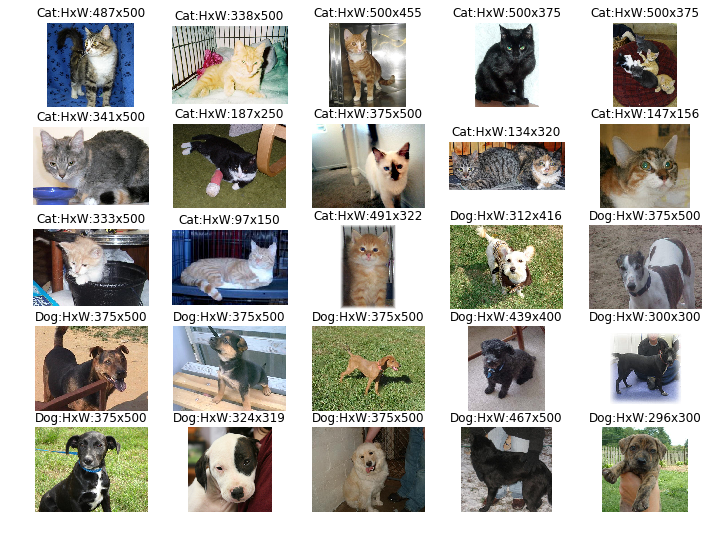

In [45]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

cats = np.random.choice(cats_train_glob, 13)
dogs = np.random.choice(dogs_train_glob, 12)
data = np.concatenate((cats, dogs))
labels = 13 * ['Cat'] + 12 *['Dog']

N, R, C = 25, 5, 5
plt.figure(figsize=(12, 9))
for k, (src, label) in enumerate(zip(data, labels)):
    im = Image.open(src).convert('RGB')
    plt.subplot(R, C, k+1)
    plt.title(f"{label}:HxW:{im.height}x{im.width}")
    plt.imshow(np.asarray(im))
    plt.axis('off')

## ImageDataGenerator will  resize each image to 299x299 by stretching or shrinking
ImageDataGenerator() will  resize each image to 299x299 by stretching or shrinking to meet the target_size.

E.g., the width of this test image is squashed from 500 to 299 pixels. The aspect ratio of the original image is thereby lost. See later subsection in the section for an example.

```python
test_image is data/train/Cat/374.jpg
Numpy Array shape (500, 375)
Numpy Array shape (299, 299)
```

### tf.keras.layers.experimental.preprocessing.Resizing (not part of core TF as of July 26, 2020)

Note: we previously resized images using the `image_size` argument of `image_dataset_from_directory`. If you want to include the resizing logic in your model, you can use the [Resizing](https://www.tensorflow.org/api_docs/python/tf/keras/layers/experimental/preprocessing/Resizing) layer instead. Try this on Google Colab using 

<a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/load_data/images.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />this image loading for flower classification notebook.</a>


## JIT loading of images via ImageDataGenerator for training/testing

Now that we have a basic directory structure, let’s practice loading image data from file for
use with modeling.

`ImageDataGenerator()` is a Keras builtin class for walking the directory structure for a dataset, loading image data, and returning the input (pixel arrays) and output (class integer).  The
main benefit of using this class to load the data is that images are loaded for a single dataset in
batches, meaning that it can be used for loading both small datasets as well as very large image
datasets with thousands or millions of images.

`ImageDataGenerator()` loads just enough images into memory for
the current and perhaps the next few mini-batches when training and evaluating a deep learning
model. The dataset is progressively
loaded from file, retrieving just enough data for what is needed immediately. 

Two additional
benefits of the using the ImageDataGenerator class are:
* that it can also automatically scale pixel values of images 
* and it can automatically generate augmented versions of images.

The constructor for the ImageDataGenerator contains
many arguments to specify how to manipulate the image data after it is loaded, including
pixel scaling and data augmentation.

1. We do not need any of these features at this stage, so configuring the ImageDataGenerator is easy.

```python
...
# create a data generator
datagen = ImageDataGenerator()
```

2. Next, an iterator is required to progressively load images for a single dataset. This requires calling the flow from directory() function and specifying the dataset directory, such as the train, test, or validation directory. The function also allows you to configure more details related to the loading of images. Of note is the target size argument that allows you to load all images to a specific size, which is often required when modeling. The function defaults to square images with the size (256, 256).

The `ImageDataGenerator()` function also allows you to specify the type of classification task via the class mode
argument, specifically whether it is `‘binary’` or a multiclass classification `‘categorical’`. The
default batch size is 32, which means that 32 randomly selected images from across the classes
in the dataset will be returned in each batch when training. You may also want to return batches in a deterministic order when evaluating a model,
which you can do by setting `shuffle` to `False`. The subdirectories of images, one for each
class, are loaded by the flow from directory() function in alphabetical order and assigned
an integer for each class. For example, the subdirectory blue comes before red alphabetically,
therefore the class labels are assigned the integers: blue=0, red=1. This can be changed via
the classes argument in calling flow from `directory()` when training the model.


```python
...
# load and iterate training dataset
train_it = datagen.flow_from_directory('data/train/', class_mode='binary', batch_size=64)
# load and iterate validation dataset
val_it = datagen.flow_from_directory('data/validation/', class_mode='binary', batch_size=64)
# load and iterate test dataset
test_it = datagen.flow_from_directory('data/test/', class_mode='binary', batch_size=64)
```

Once the iterators have been prepared, we can use them when fitting and evaluating a deep
learning model. For example, fitting a model with a data generator can be achieved by calling
the fit generator() function on the model and passing the training iterator (train it). The
validation iterator (val it) can be specified when calling this function via the validation data
argument. The steps per epoch argument must be specified for the training iterator in order
to define how many **batches of images defines a single epoch**.
For example, if you have 1,000 images in the training dataset (across all classes) and a batch
size of 64, then the steps per epoch would be about 16, or $\frac{1000}{64}$ . Similarly, if a validation
iterator is applied, then the validation steps argument must also be specified to indicate the
number of batches in the validation dataset defining one epoch.

```python
...
# define model
model = ...
# fit model
model.fit_generator(train_it, steps_per_epoch=16, validation_data=val_it,
validation_steps=8)
```

Finally, if you want to use your fit model for making predictions on a very large dataset, you
can create an iterator for that dataset as well (e.g. `test_it`) and call the predict generator()
function on the model.
```python
...
# make a prediction
yhat = model.predict_generator(test_it, steps=24)
```

# Casestudy: dogs and cats and InceptionV3 + ImageDataGenerator()
Transfer learning based on the InceptionV3 architecture and weights

With 42 layers deep, the computation cost for **Inception V3** is only about 2.5 higher than that of GoogLeNet (**GoogLeNet**, aka *Inception V1*, has 9 such Inception modules stacked linearly. It is 22 layers deep (27, including the pooling layers)), and much more efficient than that of VGGNet (16 layers). InceptionV1 has 7 million and InceptionV3 23 million parameters.  This drops to  21,802,784 parameters for our 2-class model based on the InceptionV3 backbone.


![alt text](https://cdn-images-1.medium.com/max/800/1*gqKM5V-uo2sMFFPDS84yJw.png)

For more background on InceptionV3 see [here](https://medium.com/@sh.tsang/review-inception-v3-1st-runner-up-image-classification-in-ilsvrc-2015-17915421f77c).

For more information on the Keras implementation see [here](https://keras.io/applications/#inceptionv3)


We are going to instantiate the InceptionV3 network from the keras.applications module, but using the flag `include_top=False` to load the model and their weights but leaving out the last fully connected layer, since that is specific to the ImageNet competition. It drops the `final part` of the Inveption V3 network (since `pooling=None` by default).

```python
base_model = InceptionV3(weights='imagenet', include_top=False)
```
Then we add our custom classification layer, preserving the original Inception-v3 architecture but adapting the output to our number of classes. We use a `GlobalAveragePooling2D` preceding the fully-connected Dense layer of 2 outputs.

```python
CLASSES = 2
x = base_model.output
x = GlobalAveragePooling2D(name='avg_pool')(x)
x = Dropout(0.4)(x)
predictions = Dense(CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)
```

In [32]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from keras.applications.inception_v3 import InceptionV3, preprocess_input

CLASSES = 2
    
# setup model
base_model = InceptionV3(weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D(name='avg_pool')(x)
x = Dropout(0.4)(x)
predictions = Dense(CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)
   
# transfer learning; freeze InceptionV3 42 layers
# freeze all the base_model layers and train the last ones. 
for layer in base_model.layers:
    layer.trainable = False
      
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Using TensorFlow backend.


87916544/87910968 [==============================] - 8s 0us/step
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, None, None, 3 0           batch_normalization_1[0][0]      
____________________________________________

### Visualize the 42-layer network

This visualizes the architecturs of InceptionV3. It is **HUGE**. Click next section heading in the TOC to skip this visualization

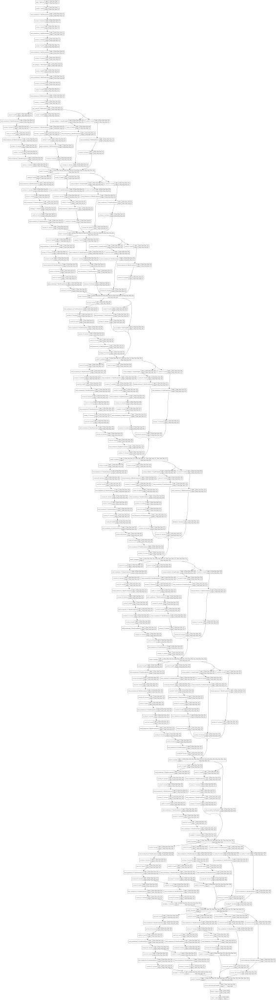

In [33]:
from IPython.display import SVG, display
from keras.utils.vis_utils import model_to_dot

SVG(model_to_dot(model, show_shapes=True).create(prog='dot', format='svg'))

## Data augmentation

Data augmentation is a common step used for increasing the dataset size and the model generalizability. Essentially, it is the process of artificially increasing the size of a dataset via transformations — rotation, flipping, cropping, stretching, lens correction, etc — .

Keras provides the class `ImageDataGenerator()` for data augmentation. This class can be parametrized to implement several transformations, and our task will be decide which transformations make sense for our data. Images will be directly taken form our defined folder structure using the method **`flow_from_directory()`**.

Preparing our data generators, we need to note the importance of the preprocessing step to adapt the input image data values to the network expected range values. This is set using the **`preprocess_input`** from the keras.applications.inception_v3 module. As noted about in the EDA section, the height and width of the training and validation  images varies quite a bit, plus the InageNet images that were used to train InceptionV3 were preprocessed (centered, normalized, etc.). The preprocess_input() is explained next.

### preprocess_input() explained for pretrained networks

Keras provides a function called preprocess_input() to prepare new input for a pretrained network. In this case InceptionV3 was trained on ImageNet images that were centered, and scaled in a particular way. For more details, see [here](https://github.com/keras-team/keras-applications/blob/master/keras_applications/imagenet_utils.py)

preprocess_input() is imported here from `keras.applications.inception_v3 import InceptionV3, preprocess_input` and therefore applies various preprocessing steps to each image (based on the ImageNet training setup using to train InceptionV3).

Here is the signature for preprocess_input():


```python 
def preprocess_input(x, data_format=None, mode='caffe', **kwargs):
    """Preprocesses a tensor or Numpy array encoding a batch of images.
    # Arguments
        x: Input Numpy or symbolic tensor, 3D or 4D.
            The preprocessed data is written over the input data
            if the data types are compatible. To avoid this
            behaviour, `numpy.copy(x)` can be used.
        data_format: Data format of the image tensor/array.
        mode: One of "caffe", "tf" or "torch".
            - caffe: will convert the images from RGB to BGR,
                then will zero-center each color channel with
                respect to the ImageNet dataset,
                without scaling.
            - tf: will scale pixels between -1 and 1,
                sample-wise.
            - torch: will scale pixels between 0 and 1 and then
                will normalize each channel with respect to the
                ImageNet dataset.
    # Returns
        Preprocessed tensor or Numpy array.
```

In [46]:
from keras.preprocessing.image import ImageDataGenerator

WIDTH = 299
HEIGHT = 299
BATCH_SIZE = 32

# data prep
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

validation_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input)

# Images will be directly taken form our defined folder structure using the method flow_from_directory()
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(HEIGHT, WIDTH),
        batch_size=BATCH_SIZE,
        class_mode='categorical')
    
validation_generator = validation_datagen.flow_from_directory(
    VALID_DIR,
    target_size=(HEIGHT, WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical')

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input)

# Images will be directly taken form our defined folder structure using the method flow_from_directory()
test_generator = validation_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(HEIGHT, WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical')


Found 1804 images belonging to 2 classes.
Found 320 images belonging to 2 classes.


Plot some images as results from data augmentation.

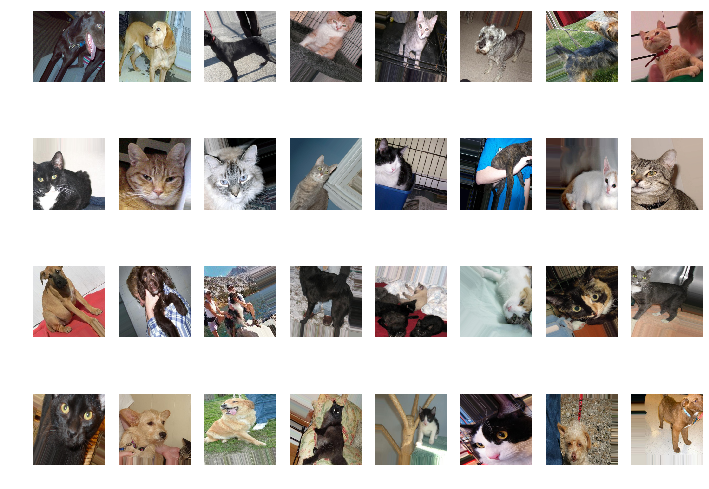

In [47]:
x_batch, y_batch = next(train_generator)

plt.figure(figsize=(12, 9))
for k, (img, lbl) in enumerate(zip(x_batch, y_batch)):
    plt.subplot(4, 8, k+1)
    plt.imshow((img + 1) / 2)
    plt.axis('off')

## Begin Transfer learning

Finally, we compile the model selecting the optimizer, the loss function, and the metric. In this case we are going to use a RMSProp optimizer with the default learning rate of `0.001`, and a `categorical_crossentropy` — used in multiclass classification tasks — as loss function.

It is important to note that we have defined three values: EPOCHS, STEPS_PER_EPOCH, and BATCH_SIZE. These values appear because we cannot pass all the data to the computer at once (due to memory limitations). So, to overcome this problem we need to divide the dataset into smaller pieces (batches) and give it to our computer one by one, updating the weights of the neural network at the end of every step (iteration) to fit it to the data given.

We have defined a typical BATCH_SIZE of 32 images, which is the number of training examples present in a single iteration or step. And 320 STEPS_PER_EPOCH as the number of iterations or batches needed to complete one epoch.

Learning is an iterative process, and one epoch is when an entire dataset is passed through the neural network. The number of epochs controls weight fitting, from underfitting to optimal to overfitting, and it must be carefully selected and monitored.

In [50]:

nb_train_samples  = len(cats_train) + len(dogs_train)
nb_valid_samples  = len(cats_valid) + len(dogs_valid)


In [81]:
EPOCHS = 2
BATCH_SIZE = 32

MODEL_FILE = 'filename.model.h5'

import time
start = time.time()
hist = history = model.fit_generator(
    train_generator,
    epochs=EPOCHS,
    steps_per_epoch=nb_train_samples // BATCH_SIZE,
    validation_data=validation_generator,
    validation_steps=nb_valid_samples // BATCH_SIZE)
end = time.time()
seconds_per_epoch = f"{(end - start)/epochs:.4}"
print(f"seconds_per_epoch: {seconds_per_epoch}")


# Now that we have trained the model and saved it in MODEL_FILE, 
# we can use it to predict the class of an image file — if there is a cat or a dog in an image— . 
# Even after only 5 epochs, the performance of this model is pretty high, with an accuracy over 
# 94% if trained on the entire 25k dataset.
model.save(MODEL_FILE)

Epoch 1/2
56/56 [==============================] - 404s 7s/step - loss: 0.1742 - acc: 0.9293 - val_loss: 0.0542 - val_acc: 0.9812
Epoch 2/2
56/56 [==============================] - 399s 7s/step - loss: 0.1810 - acc: 0.9284 - val_loss: 0.1889 - val_acc: 0.9187
seconds_per_epoch: 267.4


No handles with labels found to put in legend.
No handles with labels found to put in legend.


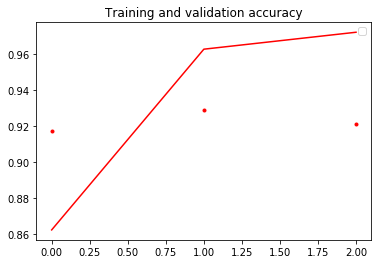

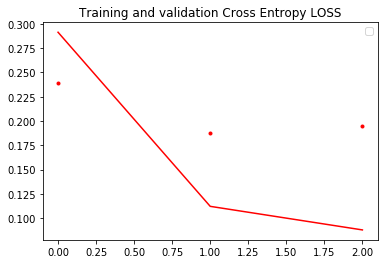

In [53]:
def plot_training(history):
  acc = history.history['acc']
  val_acc = history.history['val_acc']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(len(acc))
  
  plt.plot(epochs, acc, 'r.')
  plt.plot(epochs, val_acc, 'r')
  plt.title('Training and validation accuracy')
  plt.legend(loc="upper right")

  plt.figure()
  plt.plot(epochs, loss, 'r.')
  plt.plot(epochs, val_loss, 'r-')
  plt.title('Training and validation Cross Entropy LOSS')
  plt.legend(loc="upper right")
  plt.show()
  
plot_training(history)

### Load a test image and resize (aspect ratio is lost)
The width of the image is squashed from 500 to 299 pixels. The aspect ratio of the original image is thereby lost.

```python
test_image is data/train/Cat/374.jpg
Numpy Array shape (500, 375)
Numpy Array shape (299, 299)
```

['63.jpg', '823.jpg', '2882.jpg', '8411.jpg', '5121.jpg', '2869.jpg', '5690.jpg', '9525.jpg', '5337.jpg', '1804.jpg']
test_image is data/train/Cat/374.jpg
Numpy Array shape (500, 375)
Numpy Array shape (299, 299)


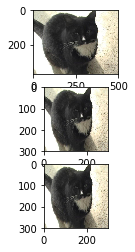

In [64]:
import os
from PIL import Image
from matplotlib import pyplot

train_cats_dir = "data/train/Cat"
train_cat_fnames = os.listdir(train_cats_dir)
print(train_cat_fnames[:10])
fname = train_cat_fnames[10]
test_image = os.path.join(train_cats_dir, fname)
print(f"test_image is {test_image}")

# resize image and force a new shape
img_orig = image.load_img(test_image)
img = image.load_img(test_image, target_size=(HEIGHT, WIDTH))
# report the size of the image
print(f"Numpy Array shape {img_orig.size}")
# resize image and ignore original aspect ratio
img_resized = img_orig.resize((HEIGHT, WIDTH))
# report the size of the resized
print(f"Numpy Array shape {img_resized.size}")
# show the image
# plot original image
pyplot.subplot(311)
pyplot.imshow(img_orig)
# resized
pyplot.subplot(312)
pyplot.imshow(img_resized)
# resized as loading
pyplot.subplot(313)
pyplot.imshow(img)
pyplot.show()


## Test custom model on sample image

Keras provides a function called preprocess_input() to prepare new input for the network. preprocess_input() does a lot of data preprocessing for pretrained networks. In this case InceptionV3 was trained on ImageNet images that were centered, and scaled in a particular way. For more details, see [here](https://github.com/keras-team/keras-applications/blob/master/keras_applications/imagenet_utils.py)

preprocess_input() is imported here from `keras.applications.inception_v3 import InceptionV3, preprocess_input` and therefore applies various preprocessing steps to each image (based on the ImageNet training setup using to train InceptionV3).

Here is the signature for preprocess_input():


```python 
def preprocess_input(x, data_format=None, mode='caffe', **kwargs):
    """Preprocesses a tensor or Numpy array encoding a batch of images.
    # Arguments
        x: Input Numpy or symbolic tensor, 3D or 4D.
            The preprocessed data is written over the input data
            if the data types are compatible. To avoid this
            behaviour, `numpy.copy(x)` can be used.
        data_format: Data format of the image tensor/array.
        mode: One of "caffe", "tf" or "torch".
            - caffe: will convert the images from RGB to BGR,
                then will zero-center each color channel with
                respect to the ImageNet dataset,
                without scaling.
            - tf: will scale pixels between -1 and 1,
                sample-wise.
            - torch: will scale pixels between 0 and 1 and then
                will normalize each channel with respect to the
                ImageNet dataset.
    # Returns
        Preprocessed tensor or Numpy array.
```

array([9.9946624e-01, 5.3373910e-04], dtype=float32)

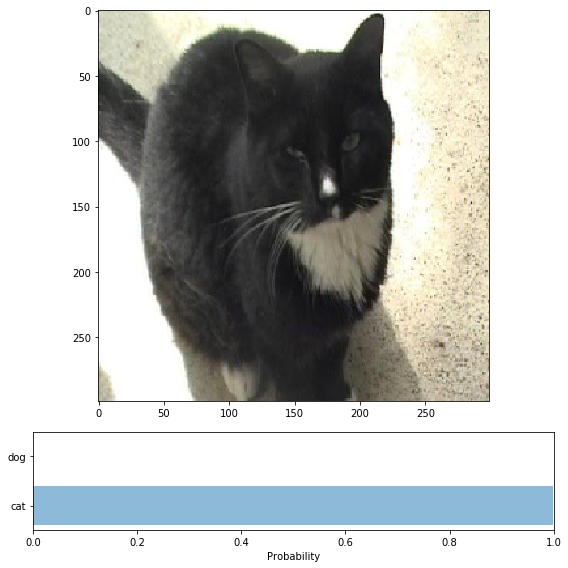

In [66]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from keras.preprocessing import image
from keras.models import load_model


def predict(model, img):
    """Run model prediction on image
    Args:
        model: keras model
        img: PIL format image
    Returns:
        list of predicted labels and their probabilities 
    """
    x = image.img_to_array(img) #convert to a NumPy array
    x = np.expand_dims(x, axis=0) # create a batch of 1 image by adding a batch axis
    x = preprocess_input(x)  #center, normalize the image
    preds = model.predict(x)
    return preds[0]


def plot_preds(img, preds):
    """Displays image and the top-n predicted probabilities in a bar graph
    Args:
        preds: list of predicted labels and their probabilities
    """
    labels = ("cat", "dog")
    gs = gridspec.GridSpec(2, 1, height_ratios=[4, 1])
    plt.figure(figsize=(8,8))
    plt.subplot(gs[0])
    plt.imshow(np.asarray(img))
    plt.subplot(gs[1])
    plt.barh([0, 1], preds, alpha=0.5)
    plt.yticks([0, 1], labels)
    plt.xlabel('Probability')
    plt.xlim(0, 1)
    plt.tight_layout()
    
model = load_model(MODEL_FILE)
img = image.load_img(test_image, target_size=(HEIGHT, WIDTH))
# predict requires the input test data to be the correct size
# notice how reduced the width more than the height
preds = predict(model, img)

plot_preds(np.asarray(img), preds)
preds

In [86]:
%time #seconds_per_epoch = 472 #default

# Images will be directly taken form our defined folder structure using the method flow_from_directory()
model = load_model(MODEL_FILE)

def model_evaluate_on_dataset(model, DIR):
    test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    test_iterator = test_datagen.flow_from_directory(
        DIR,
        target_size=(HEIGHT, WIDTH),
        batch_size=BATCH_SIZE,
        class_mode='categorical')
    # evaluate model loss on test dataset
    loss, acc = model.evaluate_generator(test_iterator, steps = len(test_iterator), verbose=0)
    return(loss, acc*100.0)
print('>loss = %.4f acc = %.3f' % evaluate_dataset(TEST_DIR))  #test dataset

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 9.78 µs
Found 376 images belonging to 2 classes.
>loss = 0.1072 acc = 95.745


In [74]:
#seconds_per_epoch = 472 #default


In [87]:
%time 
#model = load_model(MODEL_FILE)
import pandas as pd
# add the result of this experiment to the log book
epochs = EPOCHS
exp_name = "CNN-InceptionV3_2" # experiment name
try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name","epoch (secs)","Epochs","Train CXE Loss", "Train Acc", "Validation CXE Loss", "Validation  Acc",
                    "Test CXE Loss", "Test  Accuracy"])
    
# Add a experiment results to the experiment log
expLog.loc[len(expLog)] = [f"{exp_name}", seconds_per_epoch, epochs] +  list(np.round(np.reshape([model_evaluate_on_dataset(model, TRAIN_DIR), 
                   model_evaluate_on_dataset(model, VALID_DIR),
                   model_evaluate_on_dataset(model, TEST_DIR)], -1), 3))
expLog


CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 11.2 µs
Found 1804 images belonging to 2 classes.
Found 320 images belonging to 2 classes.
Found 376 images belonging to 2 classes.


,exp_name,epoch (secs),Epochs,Train CXE Loss,Train Acc,Validation CXE Loss,Validation Acc,Test CXE Loss,Test Accuracy
0,CNN-InceptionV3_2,267.4,2,0.099,97.339,0.09,97.188,0.107,95.745


## Conclusions
This introduction to transfer learning presents the steps required to adapt a CNN for custom image classification. For simplicity, it focuses on a binary classifier and using  the cats and dogs dataset.

# Bibliography
This notebook builds on  material from the following references:

* Jason Brownlee, 2019, Deep Learning for computer vision, Chapter 4.
  * Examples are located [here](https://machinelearningmastery.com/use-pre-trained-vgg-model-classify-objects-photographs/)
* and from a great tutorial on using Pillow is located [here](https://pillow.readthedocs.io/en/3.0.x/handbook/tutorial.html)
* [Pillow Homepage](https://python-pillow.org/)
* [Pillow Handbook Tutorial](https://pillow.readthedocs.io/en/stable/handbook/tutorial.html)
* [Python Imaging Library, Wikipedia](https://en.wikipedia.org/wiki/Python_Imaging_Library)
* [Matplotlib: Image tutorial](https://matplotlib.org/users/image_tutorial.html)
* [Importing Image Data into NumPy Arrays](https://www.pluralsight.com/guides/importing-image-data-into-numpy-arrays)


# Appendix: Matplotlib  API - state-machine versus object-oriented
# Matplotlib history: from matlab to OOP (object-oriented programming)
We'll now take an in-depth look at the Matplotlib package for visualization in Python. Matplotlib is a multi-platform data visualization library built on NumPy arrays, and designed to work with the broader SciPy stack. It was conceived by John Hunter in 2002, originally as a patch to IPython for enabling interactive MATLAB-style plotting via gnuplot from the IPython command line. IPython's creator, Fernando Perez, was at the time scrambling to finish his PhD, and let John know he wouldn’t have time to review the patch for several months. John took this as a cue to set out on his own, and the Matplotlib package was born, with version 0.1 released in 2003. It received an early boost when it was adopted as the plotting package of choice of the Space Telescope Science Institute (the folks behind the Hubble Telescope), which financially supported Matplotlib’s development and greatly expanded its capabilities.

One of Matplotlib’s most important features is its ability to play well with many operating systems and graphics backends. Matplotlib supports dozens of backends and output types, which means you can count on it to work regardless of which operating system you are using or which output format you wish. This cross-platform, everything-to-everyone approach has been one of the great strengths of Matplotlib. It has led to a large user base, which in turn has led to an active developer base and Matplotlib’s powerful tools and ubiquity within the scientific Python world.

In recent years, however, the interface and style of Matplotlib have begun to show their age. Newer tools like ggplot and ggvis in the R language, along with web visualization toolkits based on D3js and HTML5 canvas, often make Matplotlib feel clunky and old-fashioned. Still, I'm of the opinion that we cannot ignore Matplotlib's strength as a well-tested, cross-platform graphics engine. Recent Matplotlib versions make it relatively easy to set new global plotting styles (see Customizing Matplotlib: Configurations and Style Sheets), and people have been developing new packages that build on its powerful internals to drive Matplotlib via cleaner, more modern APIs—for example, Seaborn (discussed in Visualization With Seaborn), ggpy, HoloViews, Altair, and even Pandas itself can be used as wrappers around Matplotlib's API. Even with wrappers like these, it is still often useful to dive into Matplotlib's syntax to adjust the final plot output. For this reason, I believe that Matplotlib itself will remain a vital piece of the data visualization stack, even if new tools mean the community gradually moves away from using the Matplotlib API directly.

## matplotlib API - state-machine versus object-oriented 
One part of matplotlib that may be initially confusing is that matplotlib contains two main methods of generating plots:

* the object-oriented method, 
* and the state-machine method.

A very good overview of the difference between the two usages is provided by Jake Vanderplas. Specifically,

* [Pyplot state-machine](http://jakevdp.github.io/mpl_tutorial/tutorial_pages/tut1.html)
* [Object-oriented](http://jakevdp.github.io/mpl_tutorial/tutorial_pages/tut2.html)

If you need a primer on matplotlib beyond what is here I suggest: [Python Like you Mean It](https://www.pythonlikeyoumeanit.com/Module5_OddsAndEnds/Matplotlib.html) or the [matplotlib users guide](https://matplotlib.org/3.0.2/index.html).

In general, I (like many [others](http://patrickgray.me/open-geo-tutorial/chapter_3_visualization.html)) think you should use the object-oriented API. While more complicated, is a much more powerful way of creating plots and should be used when developing more complicated visualizations. I always recommend the OO API.

## Two Interfaces for the Price of One

A potentially confusing feature of Matplotlib is its dual interfaces: 
* a convenient MATLAB-style state-based interface, 
* and a more powerful object-oriented interface. 

We'll quickly highlight the differences between the two here.

### MATLAB-style Interface

Matplotlib was originally written as a Python alternative for MATLAB users, and much of its syntax reflects that fact.
The MATLAB-style tools are contained in the pyplot (``plt``) interface.
For example, the following code will probably look quite familiar to MATLAB users:

Text(0.5, 1.0, 'panel2 ')

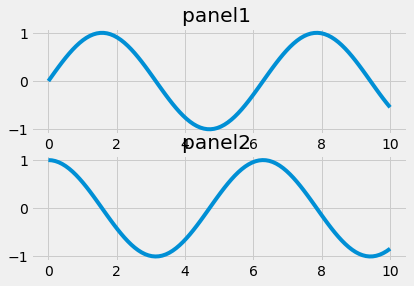

In [134]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import numpy as np
x = np.linspace(0, 10, 100)

fig = plt.figure()  # create a plot figure
# create the first of two panels and set current axis
plt.subplot(2, 1, 1) # (rows, columns, panel number)
plt.plot(x, np.sin(x))
plt.title("panel1 ")
# create the second panel and set current axis
plt.subplot(2, 1, 2)
plt.plot(x, np.cos(x));
plt.title("panel2 ")


#### MATLAB-style Interface is STATEFUL (can not go back and change earlier plots easily)
It is important to note that this interface is **stateful**: it keeps track of the "current" figure and axes, which are where all ``plt`` commands are applied.
You can get a reference to these using the ``plt.gcf()`` (get current figure) and ``plt.gca()`` (get current axes) routines.

While this stateful interface is fast and convenient for simple plots, it is easy to run into problems.
For example, once the second panel is created, how can we go back and add something to the first?
This is possible within the MATLAB-style interface, but a bit clunky.
Fortunately, there is a better way.

## Object-oriented interface (is awesome, stateless!)

The object-oriented interface is available for these more complicated situations, and for when you want more control over your figure.
Rather than depending on some notion of an "active" figure or axes, in the object-oriented interface:

* the plotting functions are *methods* of explicit ``Figure`` and ``Axes`` objects.

To re-create the previous plot using this style of plotting, you might do the following:

[Text(0, 0.5, 'cos(x)'),
 Text(0.5, 0, 'xlabel blah blah'),
 Text(0.5, 1.0, 'cosine(x)')]

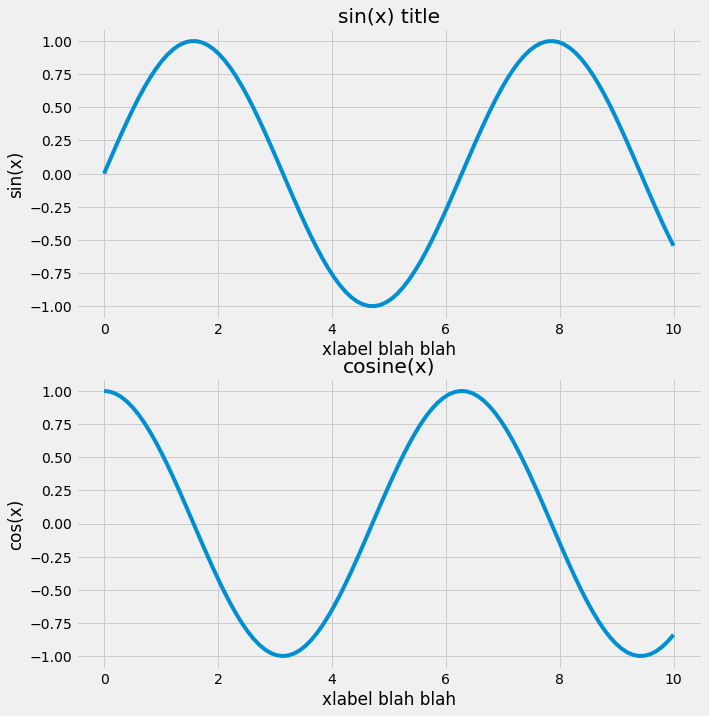

In [144]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import numpy as np
x = np.linspace(0, 10, 100)

# First create a grid of plots
# ax will be an array of two Axes objects
fig, axs = plt.subplots(2, 1, figsize = (10, 11))

# Call plot() method on the appropriate object
axs[0].plot(x, np.sin(x))
axs[1].plot(x, np.cos(x));

axs[0].set(title='sin(x) title', xlabel="xlabel blah blah", ylabel="sin(x)")
axs[1].set(title='cosine(x)', xlabel="xlabel blah blah", ylabel="cos(x)")


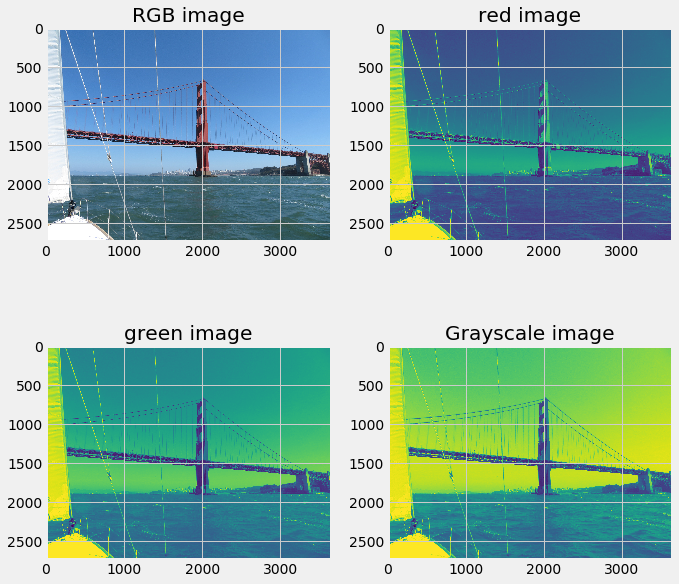

In [145]:
import matplotlib as mpl
from matplotlib import image
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import numpy as np
# load image via matplotlib
img_name = 'SF_golden_gate_bridge_3648x2736.jpg'
img = image.imread(img_name)

#show  images and its RGB channels
fig, axs = plt.subplots(2, 2, figsize=(10,10)) # figsize=(15, 1) width x height
axs[0,0].imshow(img)
axs[0, 1].imshow(img[:,:,0])
axs[1, 0].imshow(img[:,:,1])
axs[1, 1].imshow(img[:,:,2])
axs[0, 0].set(title='RGB image')
axs[0, 1].set(title='red image');
axs[1, 0].set(title='green image');
axs[1, 1].set(title='Grayscale image');

Disclaimer, I may switch between the mathplotib styles:

* between the MATLAB-style: `plt.plot()` or `plt.imshow()`
* and object-oriented interfaces: `ax.plot()` or  ax.imshow()

For more simple plots, the choice of which style to use is largely a matter of preference, but the object-oriented approach can become a necessity as plots become more complicated.
